In [2]:
import pandas as pd

df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]

In [3]:
building_class_dict = {
    'A': 'ONE FAMILY DWELLINGS',
    'A0': 'CAPE COD',
    'A1': 'TWO STORIES - DETACHED SM OR MID',
    'A2': 'ONE STORY - PERMANENT LIVING QUARTER',
    'A3': 'LARGE SUBURBAN RESIDENCE',
    'A4': 'CITY RESIDENCE ONE FAMILY',
    'A5': 'ONE FAMILY ATTACHED OR SEMI-DETACHED',
    'A6': 'SUMMER COTTAGE',
    'A7': 'MANSION TYPE OR TOWN HOUSE',
    'A8': 'BUNGALOW COLONY - COOPERATIVELY OWNED LAND',
    'A9': 'MISCELLANEOUS ONE FAMILY',
    'B': 'TWO FAMILY DWELLINGS',
    'B1': 'TWO FAMILY BRICK',
    'B2': 'TWO FAMILY FRAME',
    'B3': 'TWO FAMILY CONVERTED FROM ONE FAMILY',
    'B9': 'MISCELLANEOUS TWO FAMILY',
    'C': 'WALK UP APARTMENTS',
    'C0': 'THREE FAMILIES',
    'C1': 'OVER SIX FAMILIES WITHOUT STORES',
    'C2': 'FIVE TO SIX FAMILIES',
    'C3': 'FOUR FAMILIES',
    'C4': 'OLD LAW TENEMENT',
    'C5': 'CONVERTED DWELLINGS OR ROOMING HOUSE',
    'C6': 'WALK-UP COOPERATIVE',
    'C7': 'WALK-UP APT. OVER SIX FAMILIES WITH STORES',
    'C8': 'WALK-UP CO-OP; CONVERSION FROM LOFT/WAREHOUSE',
    'C9': 'GARDEN APARTMENTS',
    'CB': 'WALKUP APT LESS THAN 11 UNITS RESIDENTIAL',
    'CC': 'WALKUP CO-OP APT LESS THAN 11 UNITS RESIDENTIAL',
    'CM': 'MOBILE HOMES/TRAILER PARKS',
    'D': 'ELEVATOR APARTMENTS',
    'D0': 'ELEVATOR CO-OP; CONVERSION FROM LOFT/WAREHOUSE',
    'D1': 'ELEVATOR APT; SEMI-FIREPROOF WITHOUT STORES',
    'D2': 'ELEVATOR APT; ARTISTS IN RESIDENCE',
    'D3': 'ELEVATOR APT; FIREPROOF WITHOUT STORES',
    'D4': 'ELEVATOR COOPERATIVE',
    'D5': 'ELEVATOR APT; CONVERTED',
    'D6': 'ELEVATOR APT; FIREPROOF WITH STORES',
    'D7': 'ELEVATOR APT; SEMI-FIREPROOF WITH STORES',
    'D8': 'ELEVATOR APT; LUXURY TYPE',
    'D9': 'ELEVATOR APT; MISCELLANEOUS',
    'DB': 'ELEVATOR APT LESS THAN 11 UNITS RESIDENTIAL',
    'DC': 'ELEVATOR CO-OP APT LESS THAN 11 UNITS RESIDENTIAL',
    'E': 'WAREHOUSES',
    'E1': 'GENERAL WAREHOUSE',
    'E2': 'CONTRACTORS WAREHOUSE',
    'E7': 'SELF-STORAGE WAREHOUSES',
    'E9': 'MISCELLANEOUS WAREHOUSE',
    'F': 'FACTORIES AND INDUSTRIAL BUILDINGS',
    'F1': 'FACTORY; HEAVY MANUFACTURING - FIREPROOF',
    'F2': 'FACTORY; SPECIAL CONSTRUCTION - FIREPROOF',
    'F4': 'FACTORY; INDUSTRIAL SEMI-FIREPROOF',
    'F5': 'FACTORY; LIGHT MANUFACTURING',
    'F8': 'FACTORY; TANK FARM',
    'F9': 'FACTORY; INDUSTRIAL-MISCELLANEOUS',
    'G': 'GARAGES',
    'G0': 'GARAGE; RESIDENTIAL TAX CLASS 1',
    'G1': 'ALL PARKING GARAGES',
    'G2': 'AUTO BODY/COLLISION OR AUTO REPAIR',
    'G3': 'GAS STATION WITH RETAIL STORE',
    'G4': 'GAS STATION WITH SERVICE/AUTO REPAIR',
    'G5': 'GAS STATION ONLY WITH/WITHOUT SMALL KIOSK',
    'G6': 'LICENSED PARKING LOT',
    'G7': 'UNLICENSED PARKING LOT',
    'G8': 'CAR SALES/RENTAL WITH SHOWROOM',
    'G9': 'MISCELLANEOUS GARAGE',
    'GU': 'CAR SALES OR RENTAL LOTS WITHOUT SHOWROOM',
    'GW': 'CAR WASH OR LUBRITORIUM FACILITY',
    'H': 'HOTELS',
    'HB': 'BOUTIQUE: 10-100 ROOMS, W/LUXURY FACILITIES, THEMED, STYLISH, W/FULL SVC ACCOMMODATIONS',
    'HH': 'HOSTELS- BED RENTALS IN DORMITORY-LIKE SETTINGS W/SHARED ROOMS & BATHROOMS',
    'HR': 'SRO- 1 OR 2 PEOPLE HOUSED IN INDIVIDUAL ROOMS IN MULTIPLE DWELLING AFFORDABLE HOUSING',
    'HS': 'EXTENDED STAY/SUITE: AMENITIES SIMILAR TO APT; TYPICALLY CHARGE WEEKLY RATES & LESS EXPENSIVE THAN FULL-SERVICE HOTEL',
    'H1': 'LUXURY HOTEL',
    'H2': 'FULL SERVICE HOTEL',
    'H3': 'LIMITED SERVICE; MANY AFFILIATED WITH NATIONAL CHAIN',
    'H4': 'MOTEL',
    'H5': 'HOTEL; PRIVATE CLUB, LUXURY TYPE',
    'H6': 'APARTMENT HOTEL',
    'H7': 'APARTMENT HOTEL - COOPERATIVELY OWNED',
    'H8': 'DORMITORY',
    'H9': 'MISCELLANEOUS HOTEL',
    'I': 'HOSPITALS AND HEALTH FACILITIES',
    'I1': 'HOSPITAL, SANITARIUM, MENTAL INSTITUTION',
    'I2': 'INFIRMARY',
    'I3': 'DISPENSARY',
    'I4': 'HOSPITAL; STAFF FACILITY',
    'I5': 'HEALTH CENTER, CHILD CENTER, CLINIC',
    'I6': 'NURSING HOME',
    'I7': 'ADULT CARE FACILITY',
    'I9': 'MISCELLANEOUS HOSPITAL, HEALTH CARE FACILITY',
    'J': 'THEATRES',
    'J1': 'THEATRE; ART TYPE LESS THAN 400 SEATS',
    'J2': 'THEATRE; ART TYPE MORE THAN 400 SEATS',
    'J3': 'MOTION PICTURE THEATRE WITH BALCONY',
    'J4': 'LEGITIMATE THEATRE, SOLE USE',
    'J5': 'THEATRE IN MIXED-USE BUILDING',
    'J6': 'TELEVISION STUDIO',
    'J7': 'OFF BROADWAY TYPE THEATRE',
    'J8': 'MULTIPLEX PICTURE THEATRE',
    'J9': 'MISCELLANEOUS THEATRE',
    'K': 'STORE BUILDINGS',
    'K1': 'ONE STORY RETAIL BUILDING',
    'K2': 'MULTI-STORY RETAIL BUILDING (2 OR MORE)',
    'K3': 'MULTI-STORY DEPARTMENT STORE',
    'K4': 'PREDOMINANT RETAIL WITH OTHER USES',
    'K5': 'STAND-ALONE FOOD ESTABLISHMENT',
    'K6': 'SHOPPING CENTER WITH OR WITHOUT PARKING',
    'K7': 'BANKING FACILITIES WITH OR WITHOUT PARKING',
    'K8': "BIG BOX RETAIL: NOT AFFIXED & STANDING ON OWN LOT W/PARKING, E.G. COSTCO & BJ'S",
    'K9': 'MISCELLANEOUS STORE BUILDING',
    'L': 'LOFTS',
    'L1': 'LOFT; OVER 8 STORIES (MID MANH. TYPE)',
    'L2': 'LOFT; FIREPROOF AND STORAGE TYPE WITHOUT STORES',
    'L3': 'LOFT; SEMI-FIREPROOF',
    'L8': 'LOFT; WITH RETAIL STORES OTHER THAN TYPE ONE',
    'L9': 'MISCELLANEOUS LOFT',
    'M': 'RELIGIOUS FACILITIES',
    'M1': 'CHURCH, SYNAGOGUE, CHAPEL',
    'M2': 'MISSION HOUSE (NON-RESIDENTIAL)',
    'M3': 'PARSONAGE, RECTORY',
    'M4': 'CONVENT',
    'M9': 'MISCELLANEOUS RELIGIOUS FACILITY',
    'N': 'ASYLUMS AND HOMES',
    'N1': 'ASYLUM',
    'N2': 'HOME FOR INDIGENT CHILDREN, AGED, HOMELESS',
    'N3': 'ORPHANAGE',
    'N4': 'DETENTION HOUSE FOR WAYWARD GIRLS',
    'N9': 'MISCELLANEOUS ASYLUM, HOME',
    'O': 'OFFICE BUILDINGS',
    'O1': 'OFFICE ONLY - 1 STORY',
    'O2': 'OFFICE ONLY 2 - 6 STORIES',
    'O3': 'OFFICE ONLY 7 - 19 STORIES',
    'O4': 'OFFICE ONLY WITH OR WITHOUT COMM - 20 STORIES OR MORE',
    'O5': 'OFFICE WITH COMM - 1 TO 6 STORIES',
    'O6': 'OFFICE WITH COMM 7 - 19 STORIES',
    'O7': 'PROFESSIONAL BUILDINGS/STAND ALONE FUNERAL HOMES',
    'O8': 'OFFICE WITH APARTMENTS ONLY (NO COMM)',
    'O9': 'MISCELLANEOUS AND OLD STYLE BANK BLDGS.',
    'P': 'INDOOR PUBLIC ASSEMBLY & CULT. FACILITIES',
    'P1': 'CONCERT HALL',
    'P2': 'LODGE ROOM',
    'P3': 'YWCA, YMCA, YWHA, YMHA, PAL',
    'P4': 'BEACH CLUB',
    'P5': 'COMMUNITY CENTER',
    'P6': 'AMUSEMENT PLACE, BATH HOUSE, BOAT HOUSE',
    'P7': 'MUSEUM',
    'P8': 'LIBRARY',
    'P9': 'MISCELLANEOUS INDOOR PUBLIC ASSEMBLY',
    'Q': 'OUTDOOR RECREATIONAL FACILITIES',
    'Q1': 'PARKS/RECREATION FACILITY',
    'Q2': 'PLAYGROUND',
    'Q3': 'OUTDOOR POOL',
    'Q4': 'BEACH',
    'Q5': 'GOLF COURSE',
    'Q6': 'STADIUM, RACE TRACK, BASEBALL FIELD',
    'Q7': 'TENNIS COURT',
    'Q8': 'MARINA, YACHT CLUB',
    'Q9': 'MISCELLANEOUS OUTDOOR RECREATIONAL FACILITY',
    'R': 'CONDOMINIUMS',
    'RA': 'CULTURAL, MEDICAL, EDUCATIONAL, ETC.',
    'RB': 'OFFICE SPACE',
    'RG': 'INDOOR PARKING',
    'RH': 'HOTEL/BOATEL',
    'RK': 'RETAIL SPACE',
    'RP': 'OUTDOOR PARKING',
    'RR': 'CONDOMINIUM RENTALS',
    'RS': 'NON-BUSINESS STORAGE SPACE',
    'RT': 'TERRACES/GARDENS/CABANAS',
    'RW': 'WAREHOUSE/FACTORY/INDUSTRIAL',
    'R0': 'SPECIAL CONDOMINIUM BILLING LOT',
    'R1': 'CONDO; RESIDENTIAL UNIT IN 2-10 UNIT BLDG.',
    'R2': 'CONDO; RESIDENTIAL UNIT IN WALK-UP BLDG.',
    'R3': 'CONDO; RESIDENTIAL UNIT IN 1-3 STORY BLDG.',
    'R4': 'CONDO; RESIDENTIAL UNIT IN ELEVATOR BLDG.',
    'R5': 'MISCELLANEOUS COMMERCIAL',
    'R6': 'CONDO; RESID.UNIT OF 1-3 UNIT BLDG-ORIG CLASS 1',
    'R7': 'CONDO; COMML.UNIT OF 1-3 UNIT BLDG-ORIG CLASS 1',
    'R8': 'CONDO; COMML.UNIT OF 2-10 UNIT BLDG.',
    'R9': 'CO-OP WITHIN A CONDOMINIUM',
    'S': 'PRIMARILY RES. - MIXED USE',
    'S0': 'PRIMARILY 1 FAMILY WITH 2 STORES OR OFFICES',
    'S1': 'PRIMARILY 1 FAMILY WITH 1 STORE OR OFFICE',
    'S2': 'PRIMARILY 2 FAMILY WITH 1 STORE OR OFFICE',
    'S3': 'PRIMARILY 3 FAMILY WITH 1 STORE OR OFFICE',
    'S4': 'PRIMARILY 4 FAMILY WITH 1 STORE OROFFICE',
    'S5': 'PRIMARILY 5-6 FAMILY WITH 1 STORE OR OFFICE',
    'S9': 'SINGLE OR MULTIPLE DWELLING WITH STORES OR OFFICES',
    'T': 'TRANSPORTATION FACILITIES',
    'T1': 'AIRPORT, AIRFIELD, TERMINAL',
    'T2': 'PIER, DOCK, BULKHEAD',
    'T9': 'MISCELLANEOUS TRANSPORTATION FACILITY',
    'U': 'UTILITY BUREAU PROPERTIES',
    'U0': 'UTILITY COMPANY LAND AND BUILDING',
    'U1': 'BRIDGE, TUNNEL, HIGHWAY',
    'U2': 'GAS OR ELECTRIC UTILITY',
    'U3': 'CEILING RAILROAD',
    'U4': 'TELEPHONE UTILITY',
    'U5': 'COMMUNICATION FACILITY OTHER THAN TELEPHONE',
    'U6': 'RAILROAD - PRIVATE OWNERSHIP',
    'U7': 'TRANSPORTATION - PUBLIC OWNERSHIP',
    'U8': 'REVOCABLE CONSENT',
    'U9': 'MISCELLANEOUS UTILITY PROPERTY',
    'V': 'VACANT LAND',
    'V0': 'ZONED RESIDENTIAL; NOT MANHATTAN',
    'V1': 'ZONED COMMERCIAL OR MANHATTAN RESIDENTIAL',
    'V2': 'ZONED COMMERCIAL ADJACENT TO CLASS 1 DWELLING: NOT MANHATTAN',
    'V3': 'ZONED PRIMARILY RESIDENTIAL; NOT MANHATTAN',
    'V4': 'POLICE OR FIRE DEPARTMENT',
    'V5': 'SCHOOL SITE OR YARD',
    'V6': 'LIBRARY, HOSPITAL OR MUSEUM',
    'V7': 'PORT AUTHORITY OF NEW YORK AND NEW JERSEY',
    'V8': 'NEW YORK STATE OR US GOVERNMENT',
    'V9': 'MISCELLANEOUS VACANT LAND',
    'W': 'EDUCATIONAL FACILITIES',
    'W1': 'PUBLIC ELEMENTARY, JUNIOR OR SENIOR HIGH',
    'W2': 'PAROCHIAL SCHOOL, YESHIVA',
    'W3': 'SCHOOL OR ACADEMY',
    'W4': 'TRAINING SCHOOL',
    'W5': 'CITY UNIVERSITY',
    'W6': 'OTHER COLLEGE AND UNIVERSITY',
    'W7': 'THEOLOGICAL SEMINARY',
    'W8': 'OTHER PRIVATE SCHOOL',
    'W9': 'MISCELLANEOUS EDUCATIONAL FACILITY',
    'Y': 'GOVERNMENT/CITY DEPARTMENTS',
    'Y1': 'FIRE DEPARTMENT',
    'Y2': 'POLICE DEPARTMENT',
    'Y3': 'PRISON, JAIL, HOUSE OF DETENTION',
    'Y4': 'MILITARY AND NAVAL INSTALLATION',
    'Y5': 'DEPARTMENT OF REAL ESTATE',
    'Y6': 'DEPARTMENT OF SANITATION',
    'Y7': 'DEPARTMENT OF PORTS AND TERMINALS',
    'Y8': 'DEPARTMENT OF PUBLIC WORKS',
    'Y9': 'DEPARTMENT OF ENVIRONMENTAL PROTECTION',
    'Z': 'MISC. BUILDING CLASSIFICATIONS',
    'Z0': 'TENNIS COURT, POOL, SHED, ETC.',
    'Z1': 'COURT HOUSE',
    'Z2': 'PUBLIC PARKING AREA',
    'Z3': 'POST OFFICE',
    'Z4': 'FOREIGN GOVERNMENT',
    'Z5': 'UNITED NATIONS',
    'Z7': 'EASEMENT',
    'Z8': 'CEMETERY',
    'Z9': 'OTHER MISCELLANEOUS',
}

In [4]:
building_class_dict_2 = {
    'A': 'ONE FAMILY DWELLINGS',
    'B': 'TWO FAMILY DWELLINGS',
    'C': 'WALK UP APARTMENTS',
    'D': 'ELEVATOR APARTMENTS',
    'E': 'WAREHOUSES',
    'F': 'FACTORIES AND INDUSTRIAL BUILDINGS',
    'G': 'GARAGES',
    'H': 'HOTELS',
    'I': 'HOSPITALS AND HEALTH FACILITIES',
    'J': 'THEATRES',
    'K': 'STORE BUILDINGS',
    'L': 'LOFTS',
    'M': 'RELIGIOUS FACILITIES',
    'N': 'ASYLUMS AND HOMES',
    'O': 'OFFICE BUILDINGS',
    'P': 'INDOOR PUBLIC ASSEMBLY & CULT. FACILITIES',
    'Q': 'OUTDOOR RECREATIONAL FACILITIES',
    'R': 'CONDOMINIUMS',
    'S': 'PRIMARILY RES. - MIXED USE',
    'T': 'TRANSPORTATION FACILITIES',
    'U': 'UTILITY BUREAU PROPERTIES',
    'V': 'VACANT LAND',
    'W': 'EDUCATIONAL FACILITIES',
    'Y': 'GOVERNMENT/CITY DEPARTMENTS',
    'Z': 'MISC. BUILDING CLASSIFICATIONS',
}

In [5]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon, MultiPolygon
from matplotlib.colors import Normalize
from matplotlib import cm
from matplotlib.colors import ListedColormap
import numpy as np
import os

west_value, east_value, south_value, north_value = (913174.999355, 1067382.508423, 120128.274951, 272844.293823)
west_lng, east_lng, south_lat, north_lat = (-74.257159, -73.699215, 40.496010, 40.915568)

def transform(x,y):
    x = (x-east_value)*(west_lng-east_lng)/(west_value-east_value)+east_lng
    y = (y-south_value)*(north_lat-south_lat)/(north_value-south_value)+south_lat
    return (x,y)

def modify_points(geometry):
    if geometry.geom_type == 'Polygon':
        exterior_coords = [transform(x,y) for (x,y) in list(geometry.exterior.coords)]
        return Polygon(exterior_coords)
    elif geometry.geom_type == 'MultiPolygon':
        new_polygons = []
        for poly in geometry.geoms:
            exterior_coords = [transform(x,y) for (x,y) in list(poly.exterior.coords)]
            new_polygons.append(Polygon(exterior_coords))
        return MultiPolygon(new_polygons)

def draw_map(gdf,column,category,year, lower_bound, upper_bound,precision,kind):
    norm = Normalize(vmin=lower_bound, vmax=upper_bound)
    gdf.plot(column=column, cmap='viridis', norm=norm, legend=True, figsize=(12, 12))
    plt.gcf().set_size_inches(12, 12)
    plt.title(title:=category+" "+column.title()+f" of Selled Property in {str(year)} of {kind}")
    for _, row in gdf.iterrows():
        label = str(round(row[column], precision))
        color = 'black' if row[column] > gdf[column].median() else 'white'
        plt.text(row.geometry.centroid.x, row.geometry.centroid.y, label, color=color, fontsize=8, ha='center', va='center')
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)
    plt.show()

def draw_age_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year == year]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf = gpd.sjoin(gdf_points, gdf, op='within')
    sum_by_polygon = joined_gdf.groupby('index_right').agg({'LAND SQUARE FEET': 'sum', 'GROSS SQUARE FEET': 'sum', 'AGE':"mean", 'SALE PRICE':'sum'})
    sum_by_polygon["PRICE PER LAND SQUARE FEET"] = sum_by_polygon["SALE PRICE"]/sum_by_polygon["LAND SQUARE FEET"]
    sum_by_polygon["PRICE PER GROSS SQUARE FEET"] = sum_by_polygon["SALE PRICE"]/sum_by_polygon["GROSS SQUARE FEET"]
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"AGE","Average",year, lower_bound, upper_bound,0,kind)

def draw_age_change_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points_2 = gdf_points[gdf_points["SALE DATE"].dt.year == year]
        gdf_points_1 = gdf_points[gdf_points["SALE DATE"].dt.year == year-1]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf_1 = gpd.sjoin(gdf_points_1, gdf, op='within')
    joined_gdf_2 = gpd.sjoin(gdf_points_2, gdf, op='within')
    sum_by_polygon_1 = joined_gdf_1.groupby('index_right').agg({'AGE':"mean"})
    sum_by_polygon_2 = joined_gdf_2.groupby('index_right').agg({'AGE':"mean"})
    sum_by_polygon = sum_by_polygon_1.merge(sum_by_polygon_2, on="index_right")
    sum_by_polygon["percent change of age"] = (sum_by_polygon["AGE_y"] - sum_by_polygon["AGE_x"])/sum_by_polygon["AGE_x"]*100
    gdf = gdf.merge(pd.DataFrame(sum_by_polygon), left_index=True, right_index=True, how='left')
    draw_map(gdf,"percent change of age","",year,lower_bound, upper_bound,2,kind)

def draw_sale_time_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year == year]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf = gpd.sjoin(gdf_points, gdf, op='within')
    sum_by_polygon = joined_gdf.groupby('index_right')[["ADDRESS","NEIGHBORHOOD"]].count()
    sum_by_polygon["Sale Times"] = sum_by_polygon["ADDRESS"]
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"Sale Times","",year,lower_bound, upper_bound,0,kind)

def draw_sale_time_change_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points_2 = gdf_points[gdf_points["SALE DATE"].dt.year == year]
        gdf_points_1 = gdf_points[gdf_points["SALE DATE"].dt.year == year-1]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf_1 = gpd.sjoin(gdf_points_1, gdf, op='within')
    joined_gdf_2 = gpd.sjoin(gdf_points_2, gdf, op='within')
    sum_by_polygon_1 = joined_gdf_1.groupby('index_right')[["ADDRESS"]].count()
    sum_by_polygon_2 = joined_gdf_2.groupby('index_right')[["ADDRESS"]].count()
    sum_by_polygon = sum_by_polygon_1.merge(sum_by_polygon_2, on="index_right")
    sum_by_polygon["percent change of Sale Times"] = (sum_by_polygon["ADDRESS_y"] - sum_by_polygon["ADDRESS_x"])/sum_by_polygon["ADDRESS_x"]*100
    gdf = gdf.merge(pd.DataFrame(sum_by_polygon), left_index=True, right_index=True, how='left')
    draw_map(gdf,"percent change of Sale Times","",year,lower_bound, upper_bound,2,kind)

def draw_price_per_land_sqft_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year == year]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf = gpd.sjoin(gdf_points, gdf, op='within')
    sum_by_polygon = joined_gdf.groupby('index_right').agg({'LAND SQUARE FEET': 'sum', 'SALE PRICE':'sum'})
    sum_by_polygon["PRICE PER LAND SQUARE FEET"] = sum_by_polygon["SALE PRICE"]/sum_by_polygon["LAND SQUARE FEET"]
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"PRICE PER LAND SQUARE FEET","Average",year,lower_bound, upper_bound,1,kind)

def draw_price_per_land_sqft_change_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points_2 = gdf_points[gdf_points["SALE DATE"].dt.year == year]
        gdf_points_1 = gdf_points[gdf_points["SALE DATE"].dt.year == year-1]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf_1 = gpd.sjoin(gdf_points_1, gdf, op='within')
    joined_gdf_2 = gpd.sjoin(gdf_points_2, gdf, op='within')
    sum_by_polygon_1 = joined_gdf_1.groupby('index_right').agg({'LAND SQUARE FEET': 'sum', 'SALE PRICE':'sum'})
    sum_by_polygon_2 = joined_gdf_2.groupby('index_right').agg({'LAND SQUARE FEET': 'sum', 'SALE PRICE':'sum'})
    sum_by_polygon_1["PRICE PER LAND SQUARE FEET"] = sum_by_polygon_1["SALE PRICE"]/sum_by_polygon_1["LAND SQUARE FEET"]
    sum_by_polygon_2["PRICE PER LAND SQUARE FEET"] = sum_by_polygon_2["SALE PRICE"]/sum_by_polygon_2["LAND SQUARE FEET"]
    sum_by_polygon = sum_by_polygon_1.merge(sum_by_polygon_2, on="index_right")
    sum_by_polygon["percent change of PRICE PER LAND SQUARE FEET"] = (sum_by_polygon["PRICE PER LAND SQUARE FEET_y"] - sum_by_polygon["PRICE PER LAND SQUARE FEET_x"])\
        /sum_by_polygon["PRICE PER LAND SQUARE FEET_x"]*100
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"percent change of PRICE PER LAND SQUARE FEET","",year,lower_bound, upper_bound,1,kind)

def draw_price_per_gross_sqft_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year == year]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf = gpd.sjoin(gdf_points, gdf, op='within')
    sum_by_polygon = joined_gdf.groupby('index_right').agg({ 'GROSS SQUARE FEET': 'sum', 'SALE PRICE':'sum'})
    sum_by_polygon["PRICE PER GROSS SQUARE FEET"] = sum_by_polygon["SALE PRICE"]/sum_by_polygon["GROSS SQUARE FEET"]
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"PRICE PER GROSS SQUARE FEET","Average",year,lower_bound, upper_bound,1,kind)

def draw_price_per_gross_sqft_change_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points_2 = gdf_points[gdf_points["SALE DATE"].dt.year == year]
        gdf_points_1 = gdf_points[gdf_points["SALE DATE"].dt.year == year-1]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf_1 = gpd.sjoin(gdf_points_1, gdf, op='within')
    joined_gdf_2 = gpd.sjoin(gdf_points_2, gdf, op='within')
    sum_by_polygon_1 = joined_gdf_1.groupby('index_right').agg({'GROSS SQUARE FEET': 'sum', 'SALE PRICE':'sum'})
    sum_by_polygon_2 = joined_gdf_2.groupby('index_right').agg({'GROSS SQUARE FEET': 'sum', 'SALE PRICE':'sum'})
    sum_by_polygon_1["PRICE PER GROSS SQUARE FEET"] = sum_by_polygon_1["SALE PRICE"]/sum_by_polygon_1["GROSS SQUARE FEET"]
    sum_by_polygon_2["PRICE PER GROSS SQUARE FEET"] = sum_by_polygon_2["SALE PRICE"]/sum_by_polygon_2["GROSS SQUARE FEET"]
    sum_by_polygon = sum_by_polygon_1.merge(sum_by_polygon_2, on="index_right")
    sum_by_polygon["percent change of PRICE PER GROSS SQUARE FEET"] = (sum_by_polygon["PRICE PER GROSS SQUARE FEET_y"] - sum_by_polygon["PRICE PER GROSS SQUARE FEET_x"])\
        /sum_by_polygon["PRICE PER GROSS SQUARE FEET_x"]*100
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"percent change of PRICE PER GROSS SQUARE FEET","",year,lower_bound, upper_bound,1,kind)


def draw_price_per_gross_sqft_change_unit_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year == year]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf = gpd.sjoin(gdf_points, gdf, op='within')
    sum_by_polygon = joined_gdf.groupby('index_right').agg({ 'GROSS SQUARE FEET': 'sum', 'SALE PRICE':'sum'})
    sum_by_polygon["PRICE PER GROSS SQUARE FEET RMB SQMI"] = sum_by_polygon["SALE PRICE"]*7.3/sum_by_polygon["GROSS SQUARE FEET"]/0.092903
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"PRICE PER GROSS SQUARE FEET RMB SQMI","Average",year,lower_bound, upper_bound,1,kind)

def draw_gross_land_sqft_ratio_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year == year]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf = gpd.sjoin(gdf_points, gdf, op='within')
    sum_by_polygon = joined_gdf.groupby('index_right').agg({ 'GROSS SQUARE FEET': 'sum', 'LAND SQUARE FEET': 'sum'})
    sum_by_polygon["GROSS LAND SQUARE FEET RATIO"] = sum_by_polygon["GROSS SQUARE FEET"]/sum_by_polygon["LAND SQUARE FEET"]
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"GROSS LAND SQUARE FEET RATIO","",year,lower_bound, upper_bound,2,kind)


def draw_gross_land_sqft_ratio_change_map(gdf,gdf_points,year,kind,lower_bound, upper_bound):
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    if type(year) is int:
        gdf_points_2 = gdf_points[gdf_points["SALE DATE"].dt.year == year]
        gdf_points_1 = gdf_points[gdf_points["SALE DATE"].dt.year == year-1]
    elif year == "All":
        pass
    else:
        gdf_points = gdf_points[gdf_points["SALE DATE"].dt.year in year]
    joined_gdf_1 = gpd.sjoin(gdf_points_1, gdf, op='within')
    joined_gdf_2 = gpd.sjoin(gdf_points_2, gdf, op='within')
    sum_by_polygon_1 = joined_gdf_1.groupby('index_right').agg({ 'GROSS SQUARE FEET': 'sum', 'LAND SQUARE FEET': 'sum'})
    sum_by_polygon_2 = joined_gdf_2.groupby('index_right').agg({ 'GROSS SQUARE FEET': 'sum', 'LAND SQUARE FEET': 'sum'})
    sum_by_polygon_1["GROSS LAND SQUARE FEET RATIO"] = sum_by_polygon_1["GROSS SQUARE FEET"]/sum_by_polygon_1["LAND SQUARE FEET"]
    sum_by_polygon_2["GROSS LAND SQUARE FEET RATIO"] = sum_by_polygon_2["GROSS SQUARE FEET"]/sum_by_polygon_2["LAND SQUARE FEET"]
    sum_by_polygon = sum_by_polygon_1.merge(sum_by_polygon_2, on="index_right")
    sum_by_polygon["percent change of GROSS LAND SQUARE FEET RATIO"] = (sum_by_polygon["GROSS LAND SQUARE FEET RATIO_y"] - sum_by_polygon["GROSS LAND SQUARE FEET RATIO_x"])\
        /sum_by_polygon["GROSS LAND SQUARE FEET RATIO_x"]*100
    gdf = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf,"percent change of GROSS LAND SQUARE FEET RATIO","",year,lower_bound, upper_bound,1,kind)

In [2]:
import os

shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

NameError: name 'gpd' is not defined

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


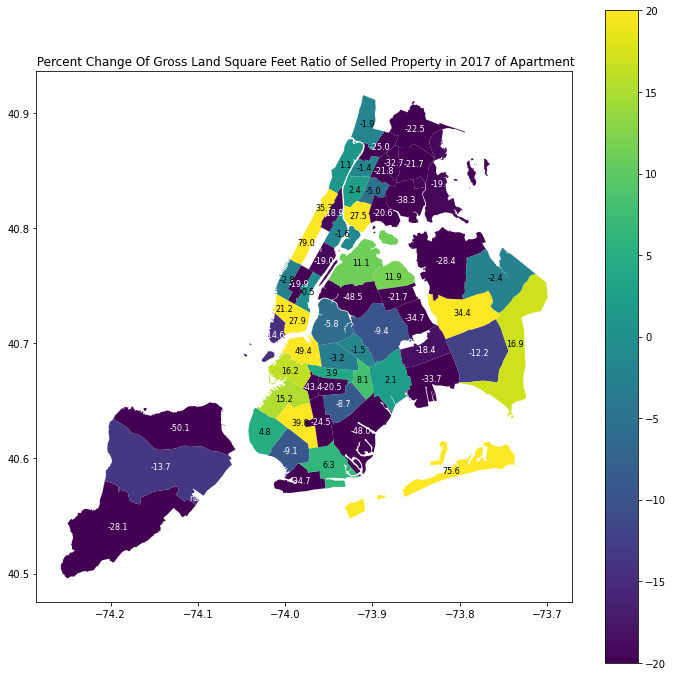

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


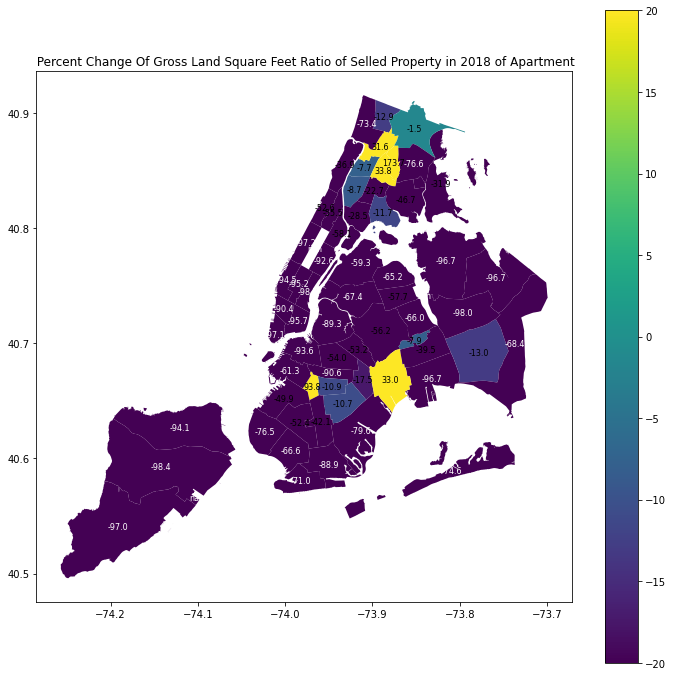

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


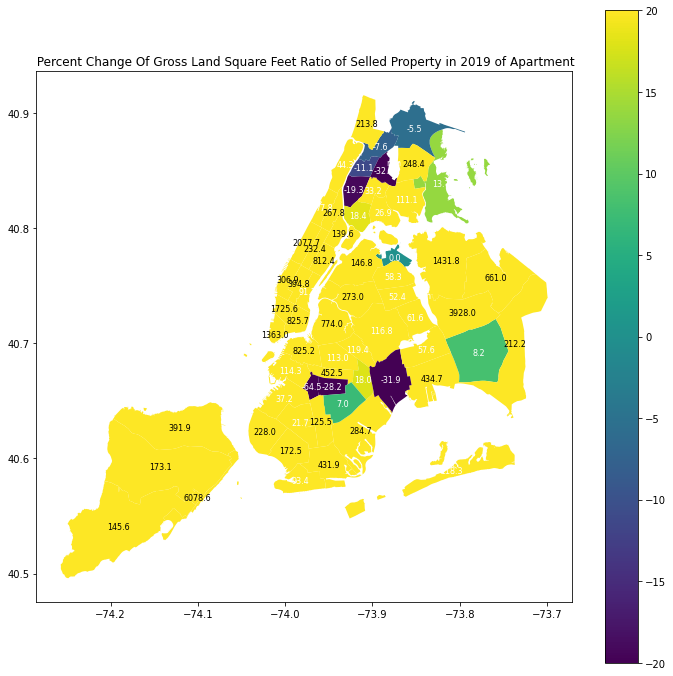

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


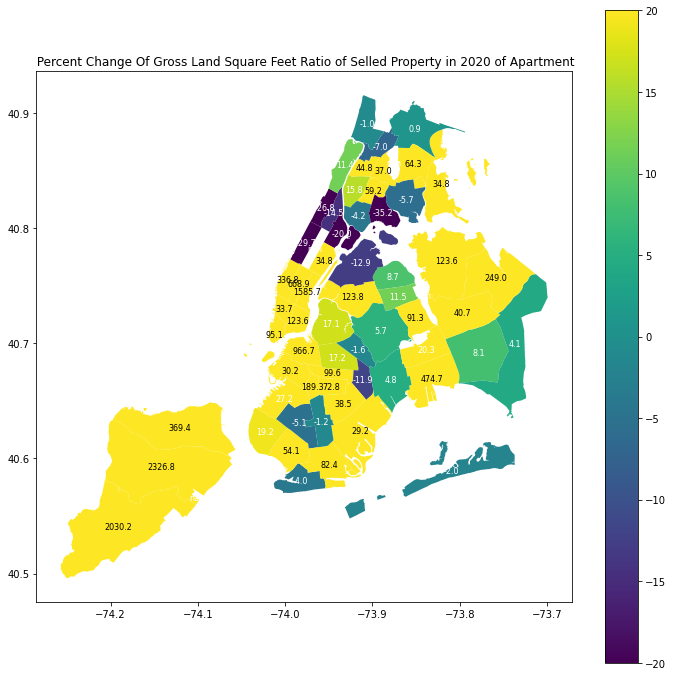

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


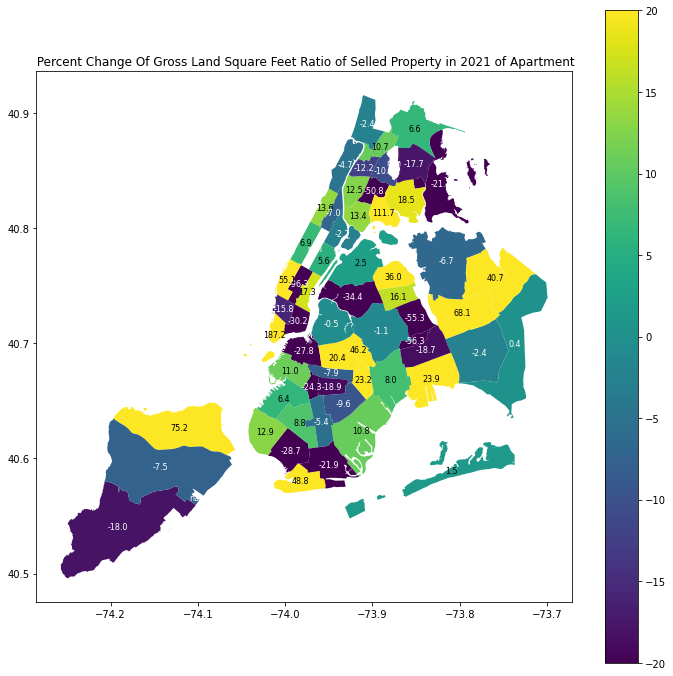

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


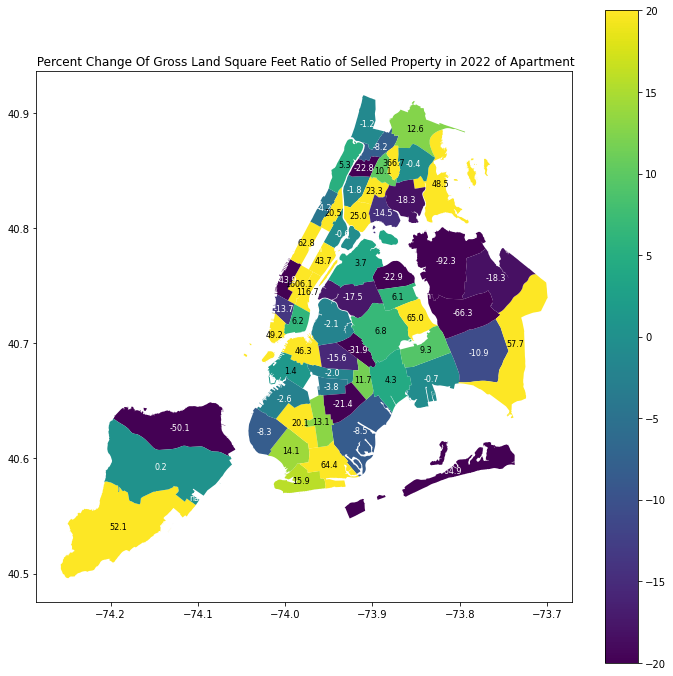

In [9]:
residential_list = ["A","B","C","D",'L','R',"S"]
house_list = ["A","B"]
apartment_list = ["C","D",'L','R',"S"]
commercial_list = ['I','H','J','K','O']
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in apartment_list)]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

for year in [2017,2018,2019,2020,2021,2022]:
    gdf_points["SALE DATE"] = pd.to_datetime(gdf_points["SALE DATE"])
    gdf_points_2 = gdf_points[gdf_points["SALE DATE"].dt.year == year]
    gdf_points_1 = gdf_points[gdf_points["SALE DATE"].dt.year == year-1]
    joined_gdf_1 = gpd.sjoin(gdf_points_1, gdf, op='within')
    joined_gdf_2 = gpd.sjoin(gdf_points_2, gdf, op='within')
    sum_by_polygon_1 = joined_gdf_1.groupby('index_right').agg({ 'GROSS SQUARE FEET': 'sum', 'LAND SQUARE FEET': 'sum'})
    sum_by_polygon_2 = joined_gdf_2.groupby('index_right').agg({ 'GROSS SQUARE FEET': 'sum', 'LAND SQUARE FEET': 'sum'})
    sum_by_polygon_1["GROSS LAND SQUARE FEET RATIO"] = sum_by_polygon_1["GROSS SQUARE FEET"]/sum_by_polygon_1["LAND SQUARE FEET"]
    sum_by_polygon_2["GROSS LAND SQUARE FEET RATIO"] = sum_by_polygon_2["GROSS SQUARE FEET"]/sum_by_polygon_2["LAND SQUARE FEET"]
    sum_by_polygon = sum_by_polygon_1.merge(sum_by_polygon_2, on="index_right")
    sum_by_polygon["percent change of GROSS LAND SQUARE FEET RATIO"] = (sum_by_polygon["GROSS LAND SQUARE FEET RATIO_y"] - sum_by_polygon["GROSS LAND SQUARE FEET RATIO_x"])\
    /sum_by_polygon["GROSS LAND SQUARE FEET RATIO_x"]*100
    gdf_1 = gdf.merge(sum_by_polygon, left_index=True, right_index=True, how='left')
    draw_map(gdf_1,"percent change of GROSS LAND SQUARE FEET RATIO","",year,-20,20,1,"apartment".title())

In [6]:
df_1.columns

Index(['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS', 'ZIP CODE',
       'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District'],
      dtype='object')

In [7]:
building_class_dict_2

{'A': 'ONE FAMILY DWELLINGS',
 'B': 'TWO FAMILY DWELLINGS',
 'C': 'WALK UP APARTMENTS',
 'D': 'ELEVATOR APARTMENTS',
 'E': 'WAREHOUSES',
 'F': 'FACTORIES AND INDUSTRIAL BUILDINGS',
 'G': 'GARAGES',
 'H': 'HOTELS',
 'I': 'HOSPITALS AND HEALTH FACILITIES',
 'J': 'THEATRES',
 'K': 'STORE BUILDINGS',
 'L': 'LOFTS',
 'M': 'RELIGIOUS FACILITIES',
 'N': 'ASYLUMS AND HOMES',
 'O': 'OFFICE BUILDINGS',
 'P': 'INDOOR PUBLIC ASSEMBLY & CULT. FACILITIES',
 'Q': 'OUTDOOR RECREATIONAL FACILITIES',
 'R': 'CONDOMINIUMS',
 'S': 'PRIMARILY RES. - MIXED USE',
 'T': 'TRANSPORTATION FACILITIES',
 'U': 'UTILITY BUREAU PROPERTIES',
 'V': 'VACANT LAND',
 'W': 'EDUCATIONAL FACILITIES',
 'Y': 'GOVERNMENT/CITY DEPARTMENTS',
 'Z': 'MISC. BUILDING CLASSIFICATIONS'}

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


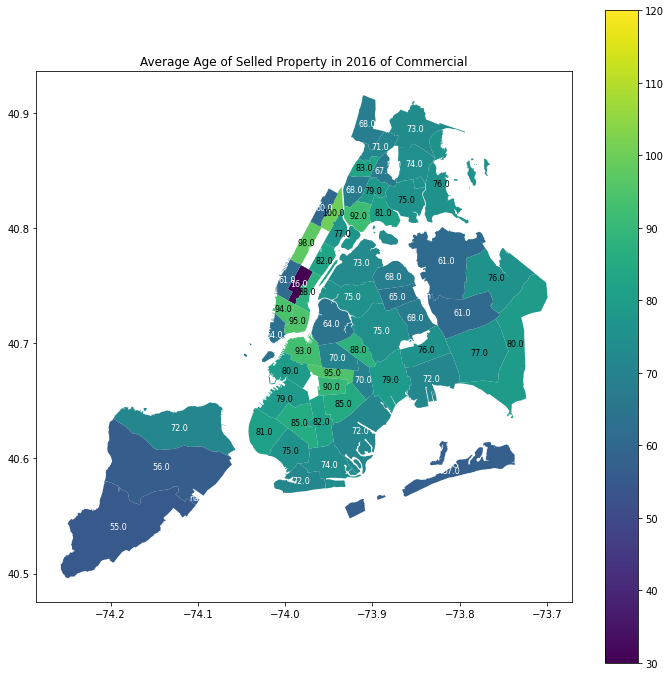

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


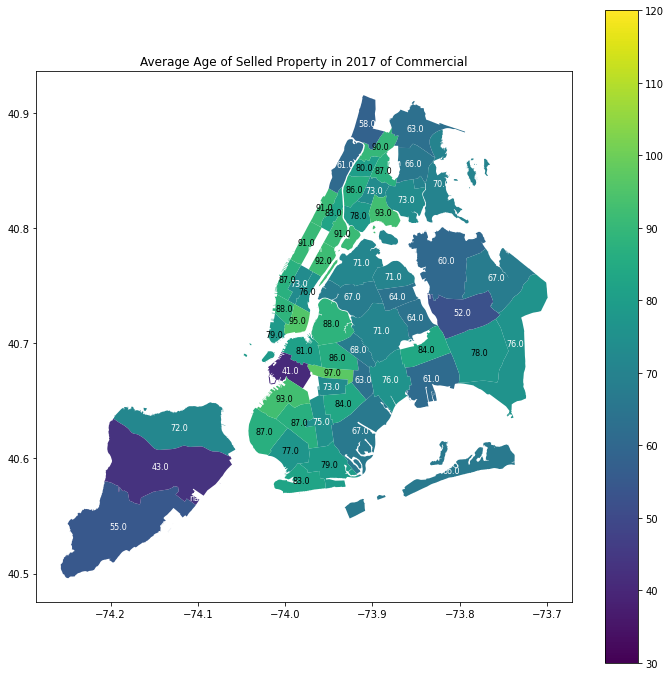

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


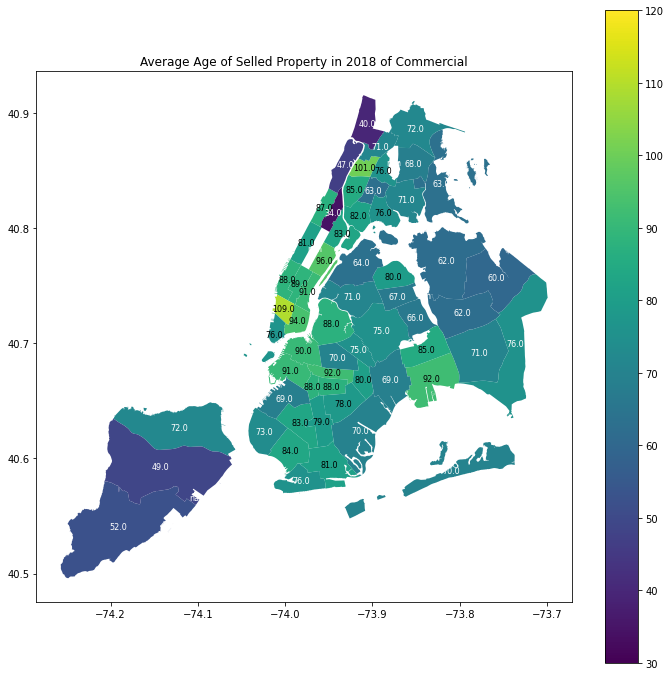

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


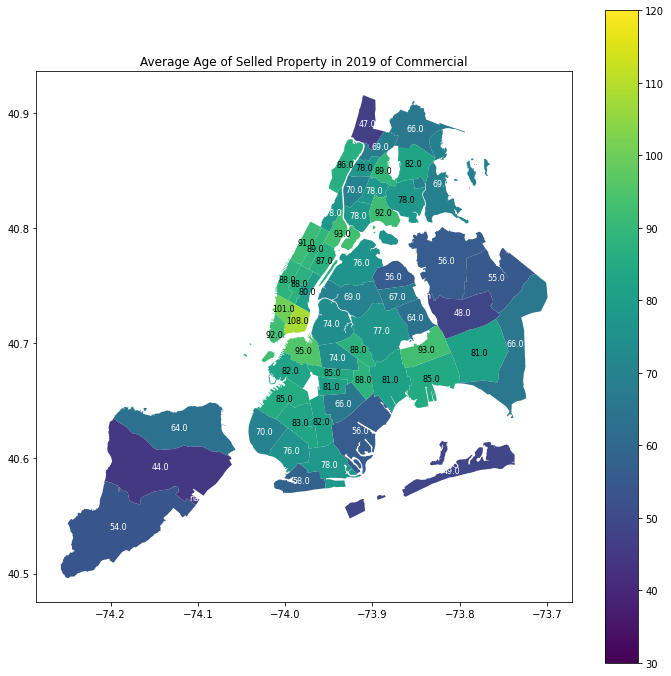

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


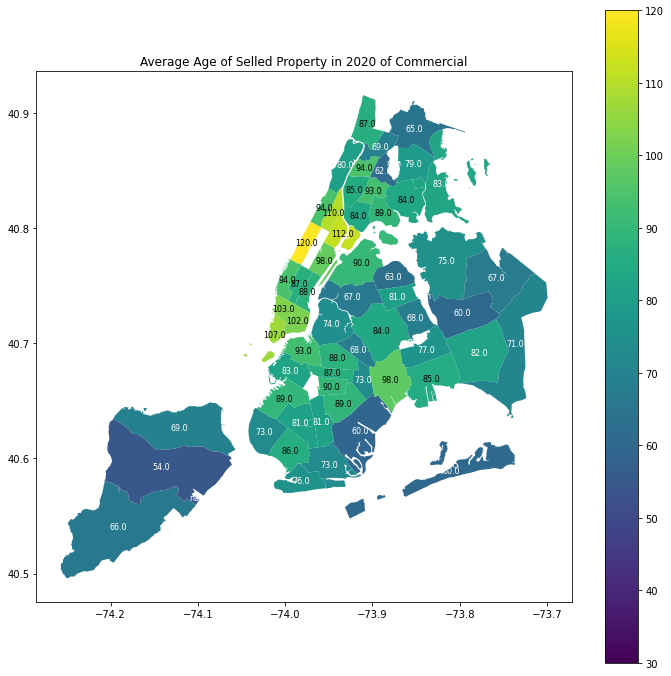

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


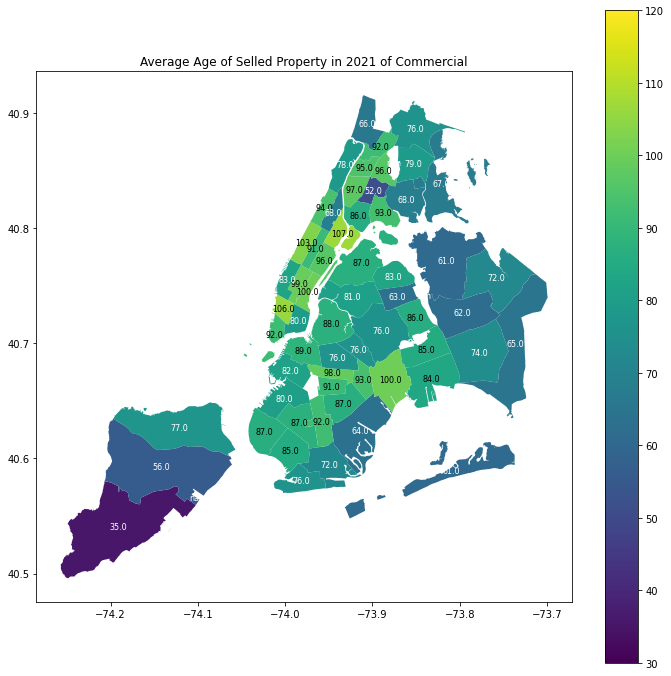

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


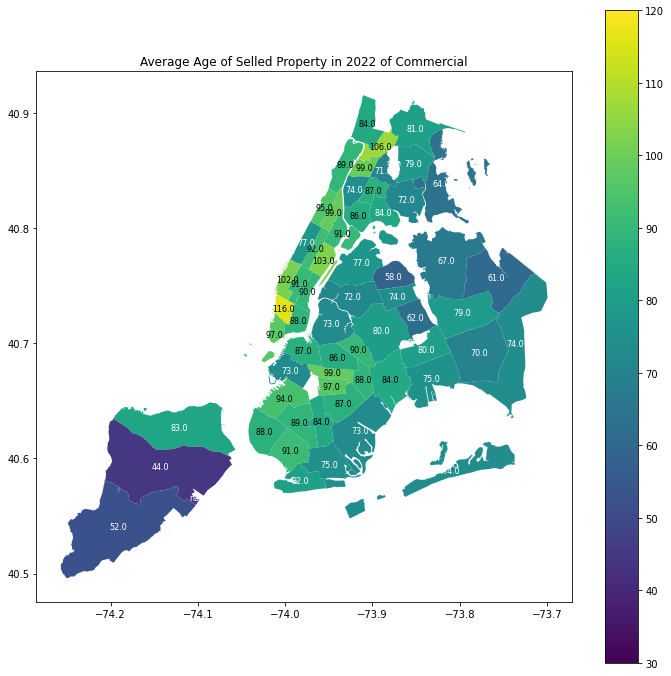

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


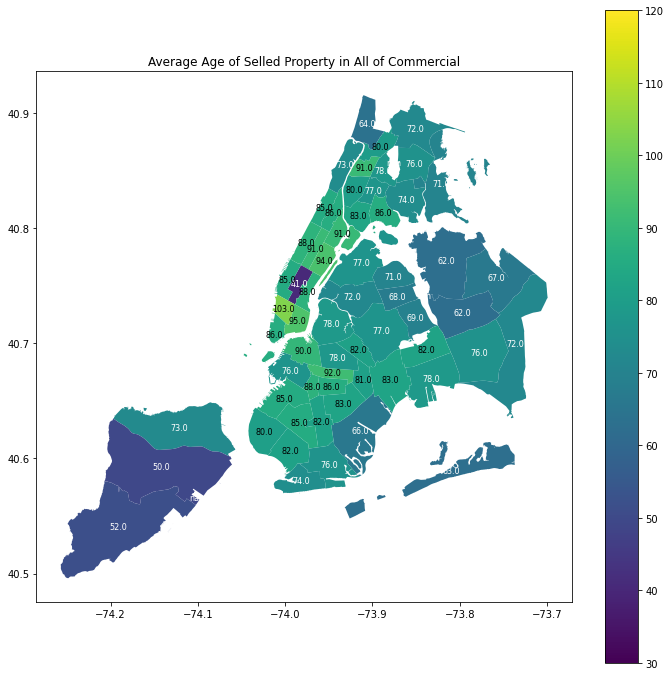

In [8]:
import pandas as pd
import os

df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in ['K','O','H','J','I','P'])]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')
for year in [2016,2017,2018,2019,2020,2021,2022,"All"]:
    draw_age_map(gdf,gdf_points,year,"Commercial".title())

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


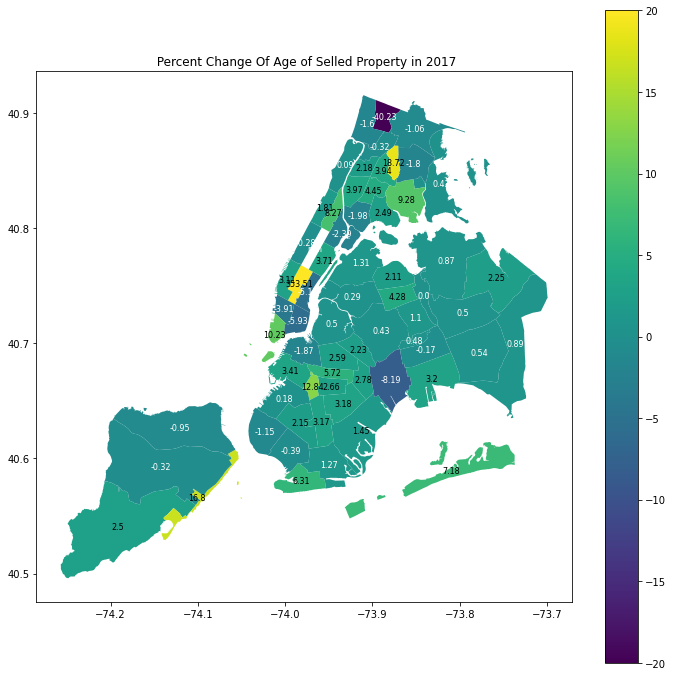

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


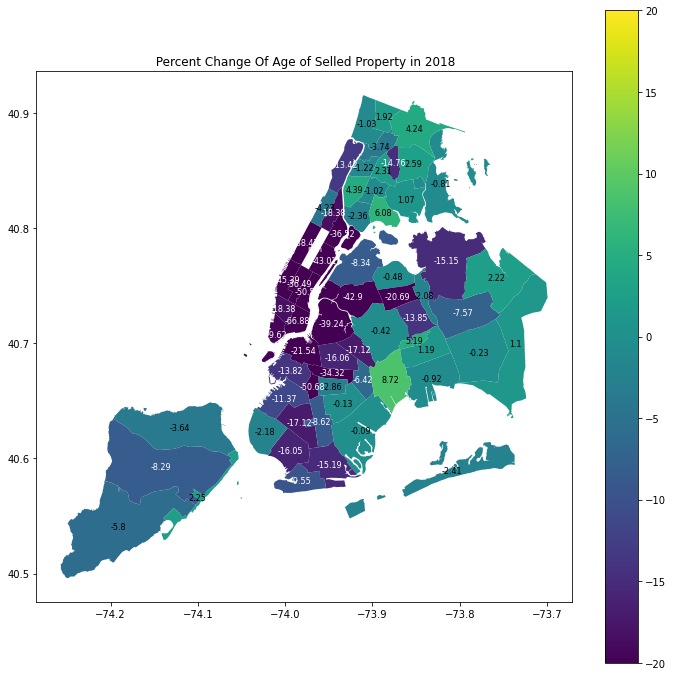

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


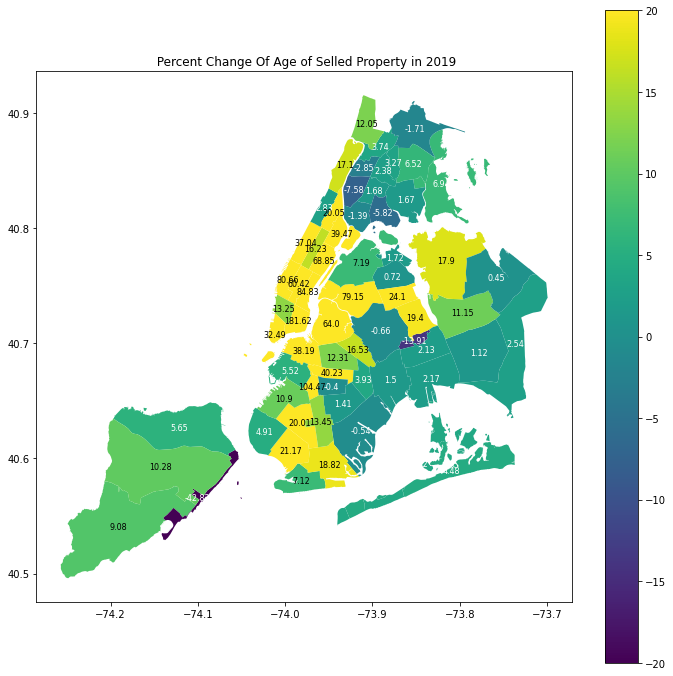

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


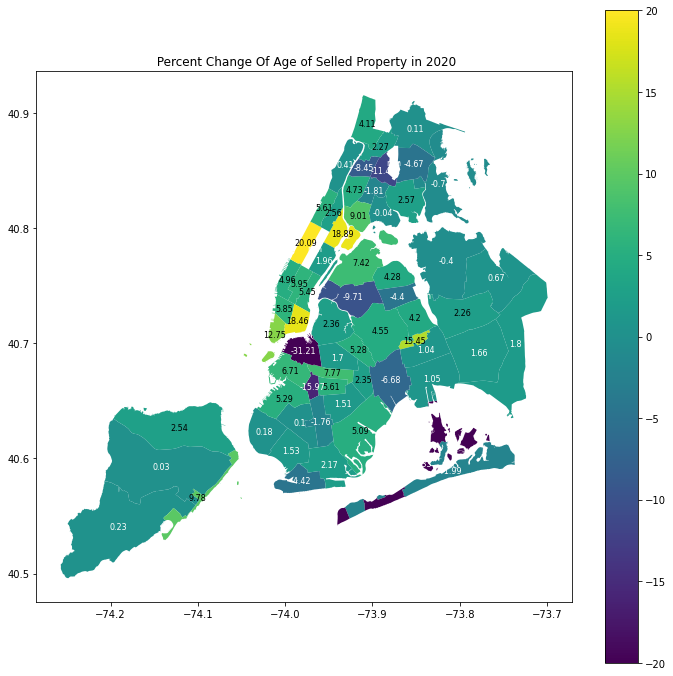

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


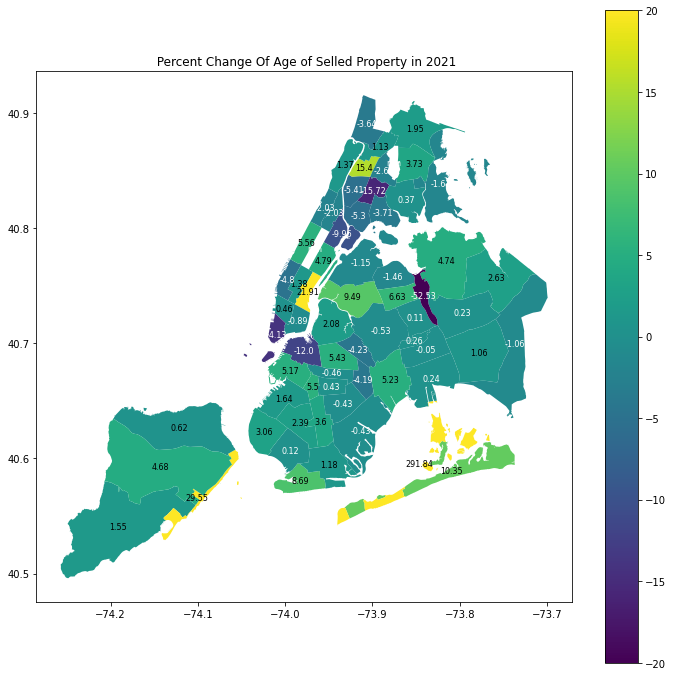

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


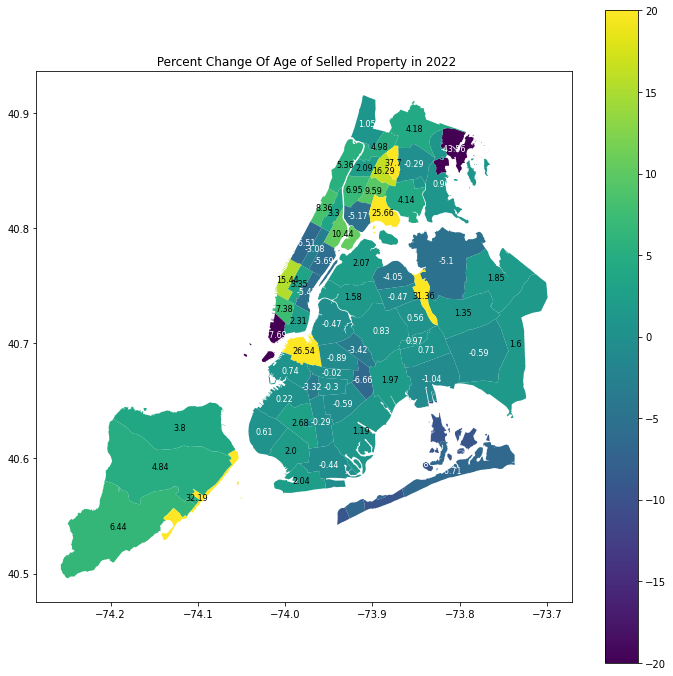

In [36]:
for year in [2017,2018,2019,2020,2021,2022]:
    draw_age_change_map(gdf,gdf_points,year)

In [9]:
building_class_dict_2

{'A': 'ONE FAMILY DWELLINGS',
 'B': 'TWO FAMILY DWELLINGS',
 'C': 'WALK UP APARTMENTS',
 'D': 'ELEVATOR APARTMENTS',
 'E': 'WAREHOUSES',
 'F': 'FACTORIES AND INDUSTRIAL BUILDINGS',
 'G': 'GARAGES',
 'H': 'HOTELS',
 'I': 'HOSPITALS AND HEALTH FACILITIES',
 'J': 'THEATRES',
 'K': 'STORE BUILDINGS',
 'L': 'LOFTS',
 'M': 'RELIGIOUS FACILITIES',
 'N': 'ASYLUMS AND HOMES',
 'O': 'OFFICE BUILDINGS',
 'P': 'INDOOR PUBLIC ASSEMBLY & CULT. FACILITIES',
 'Q': 'OUTDOOR RECREATIONAL FACILITIES',
 'R': 'CONDOMINIUMS',
 'S': 'PRIMARILY RES. - MIXED USE',
 'T': 'TRANSPORTATION FACILITIES',
 'U': 'UTILITY BUREAU PROPERTIES',
 'V': 'VACANT LAND',
 'W': 'EDUCATIONAL FACILITIES',
 'Y': 'GOVERNMENT/CITY DEPARTMENTS',
 'Z': 'MISC. BUILDING CLASSIFICATIONS'}

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


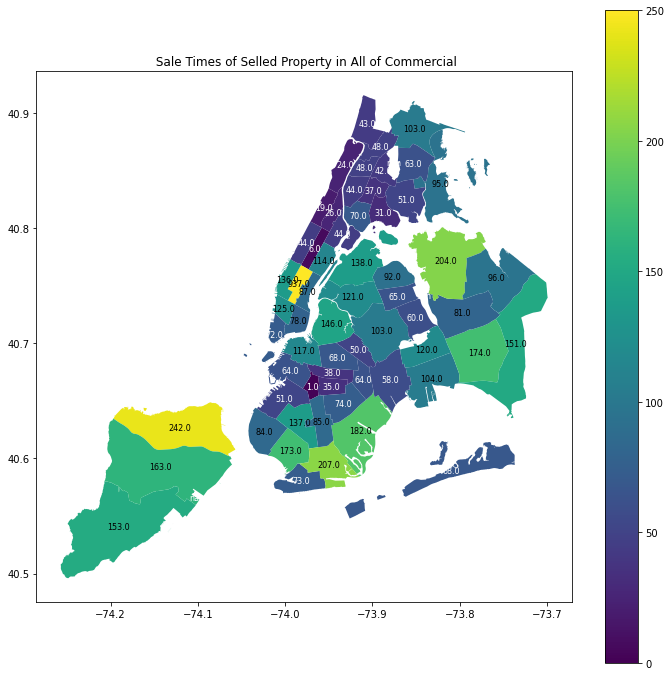

In [7]:
for year in ["All"]:
    draw_sale_time_map(gdf,gdf_points,year,"Commercial",0,250)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


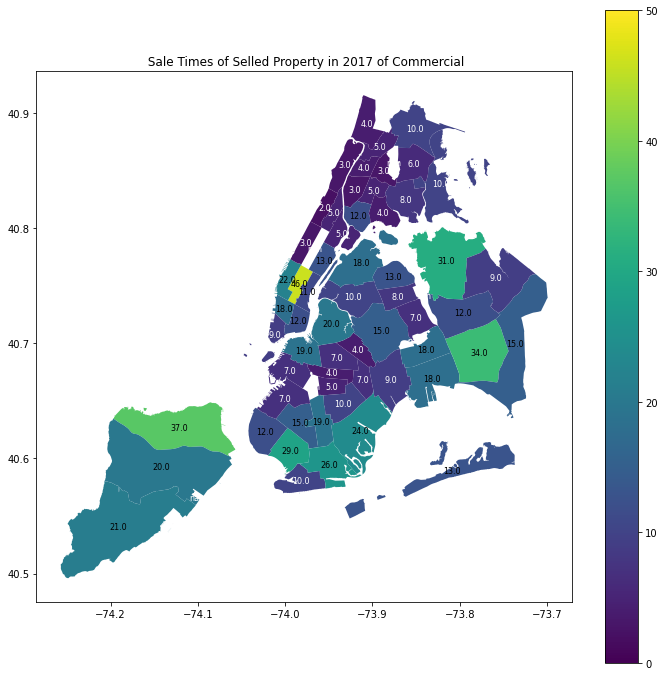

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


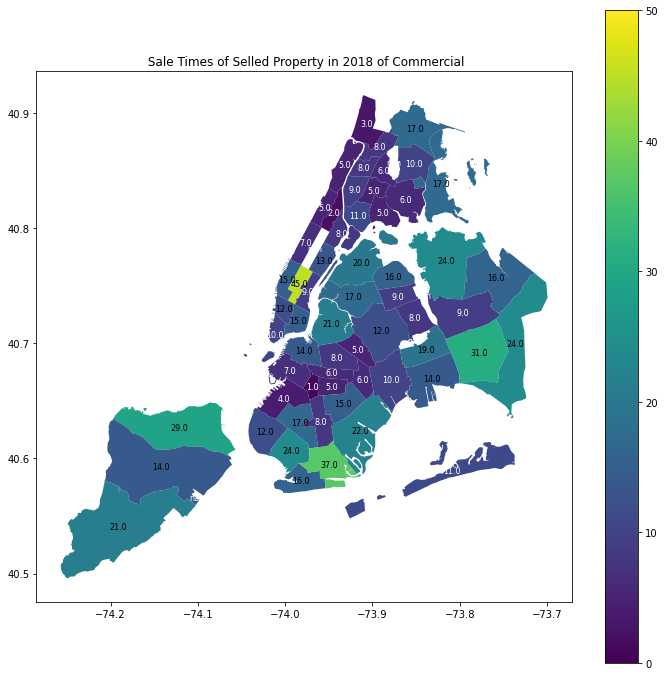

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


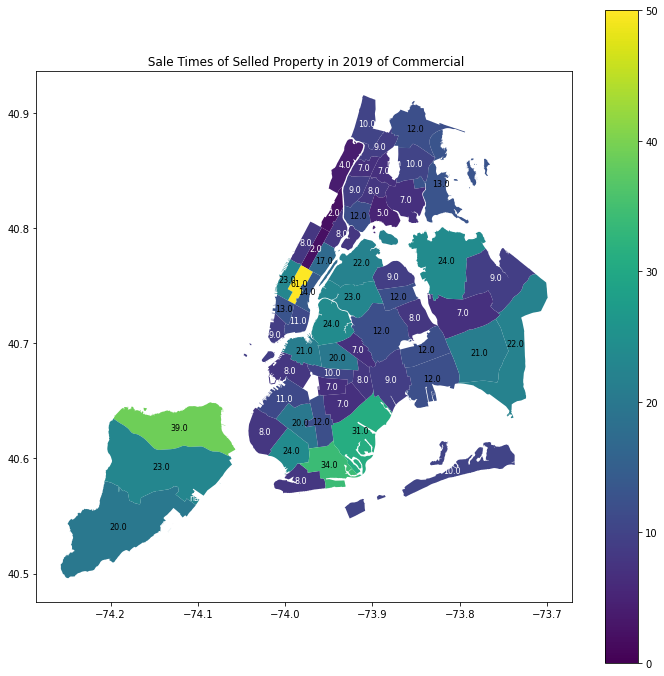

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


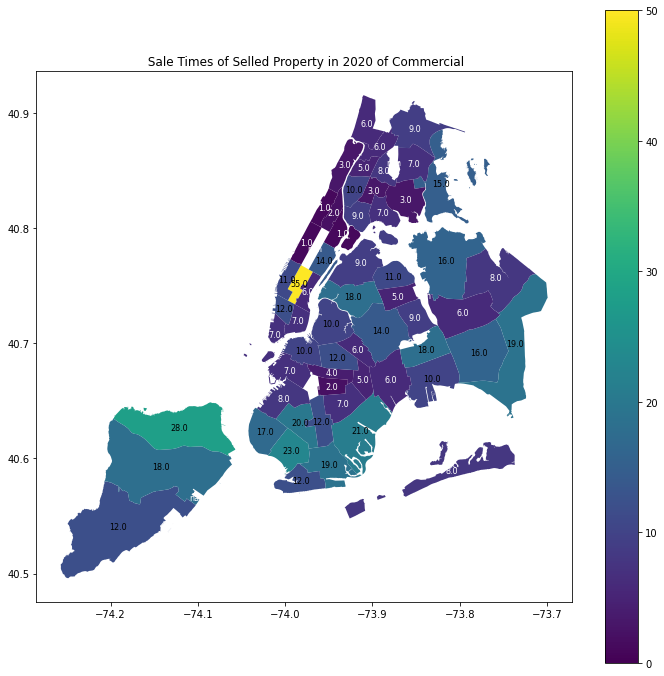

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


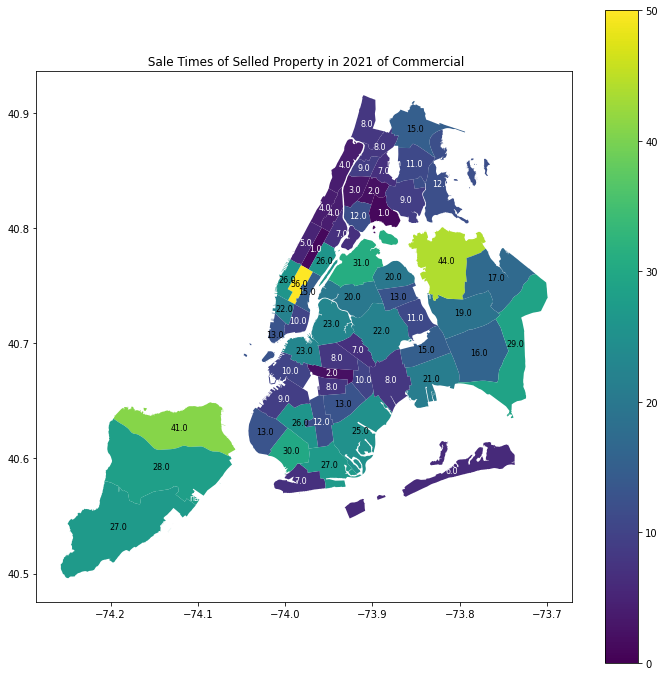

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


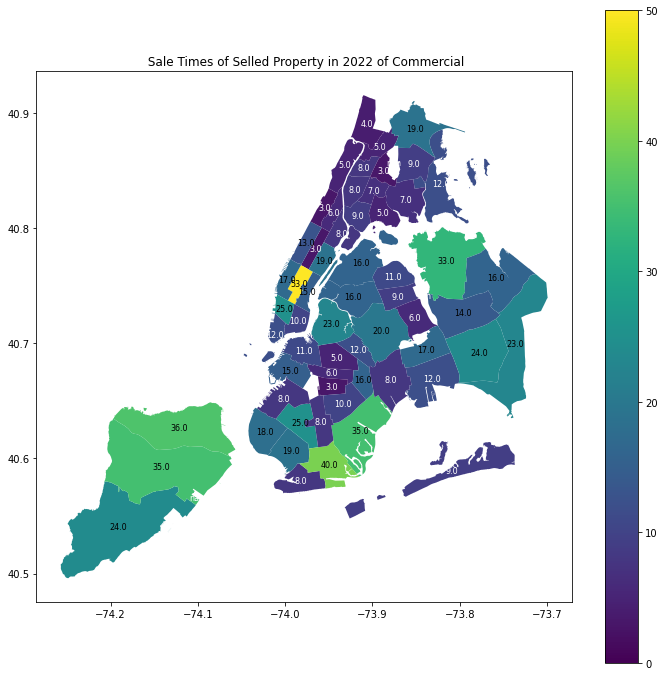

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


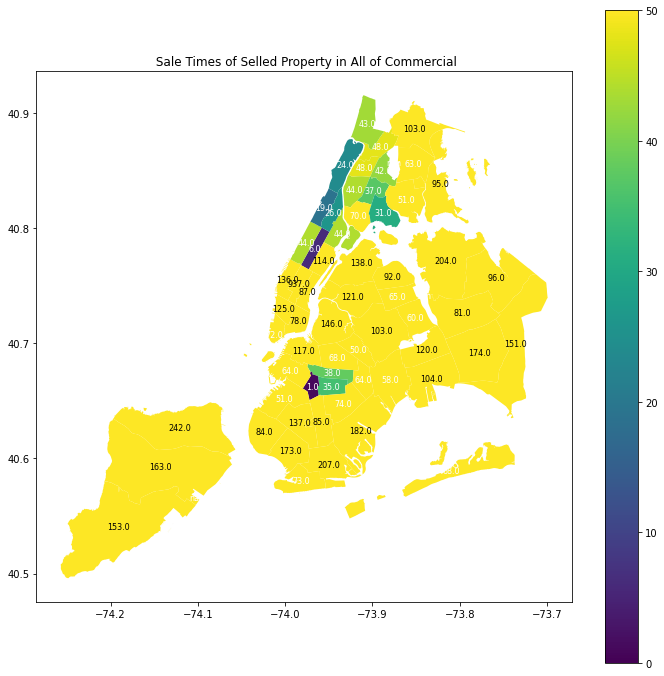

In [5]:
import pandas as pd

df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in ['I','H','J','K','O'])]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

for year in [2017,2018,2019,2020,2021,2022,"All"]:
    draw_sale_time_map(gdf,gdf_points,year,"Commercial",0,50)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


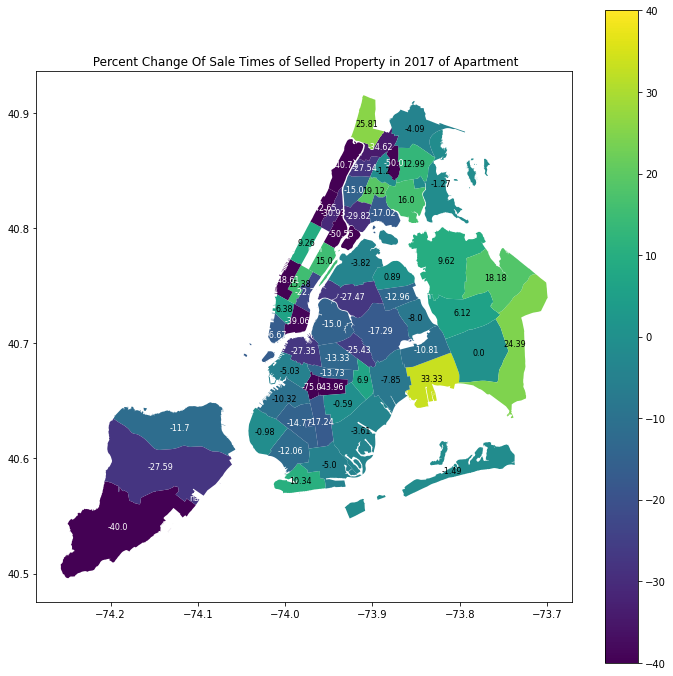

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


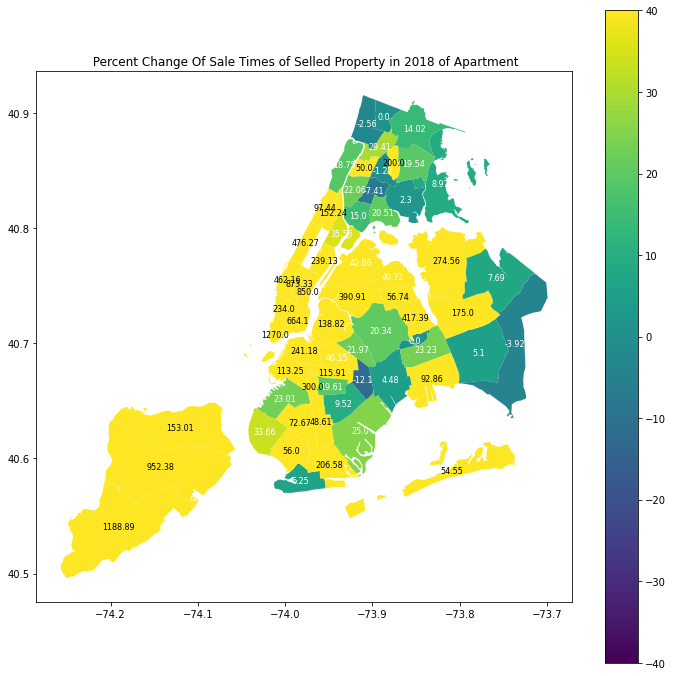

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


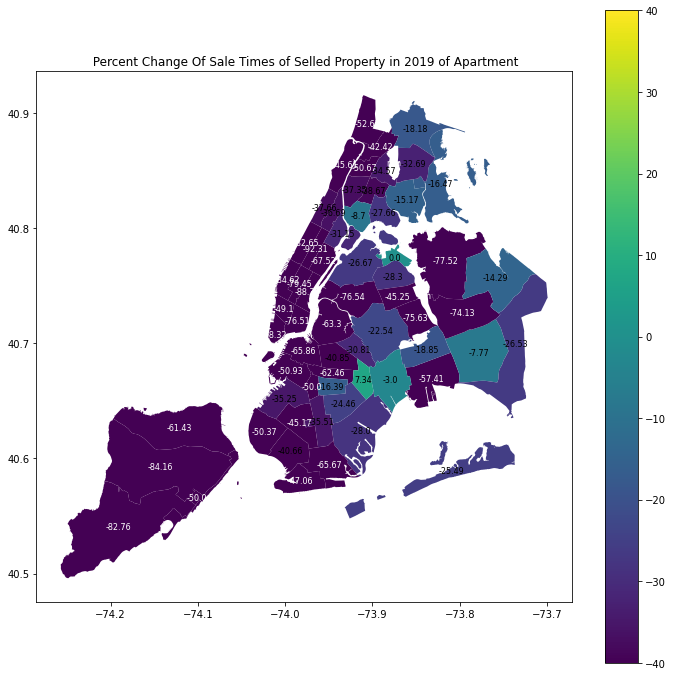

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


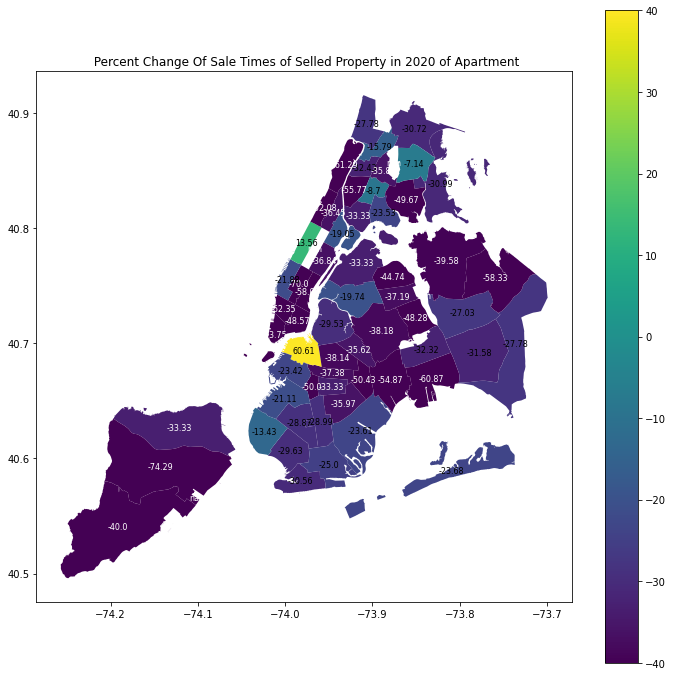

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


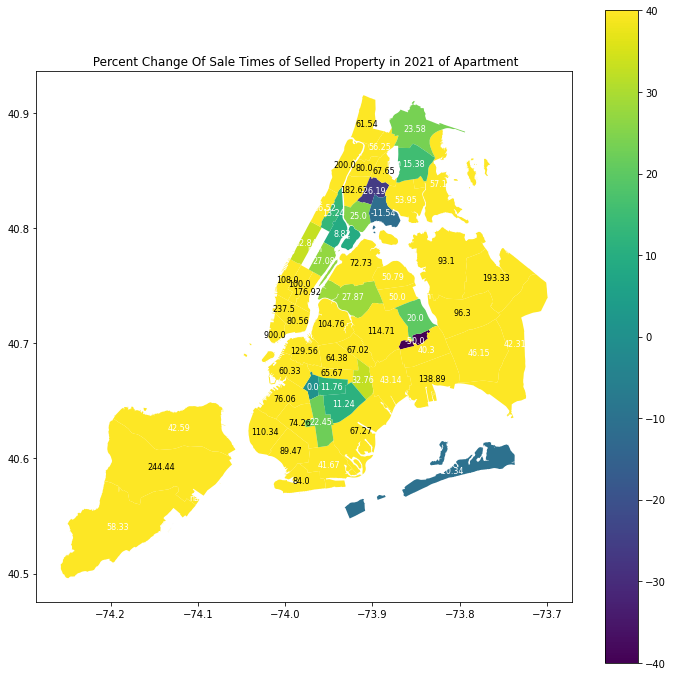

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


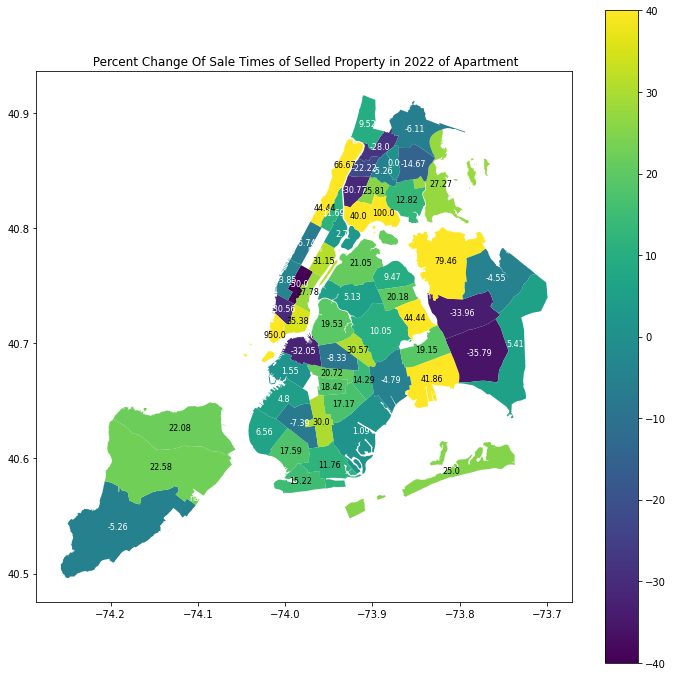

In [13]:
residential_list = ["A","B","C","D",'L','R',"S"]
house_list = ["A","B"]
apartment_list = ["C","D",'L','R',"S"]
commercial_list = ['I','H','J','K','O']
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in apartment_list)]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

for year in [2017,2018,2019,2020,2021,2022]:
    draw_sale_time_change_map(gdf,gdf_points,year,"apartment".title(),-40,40)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


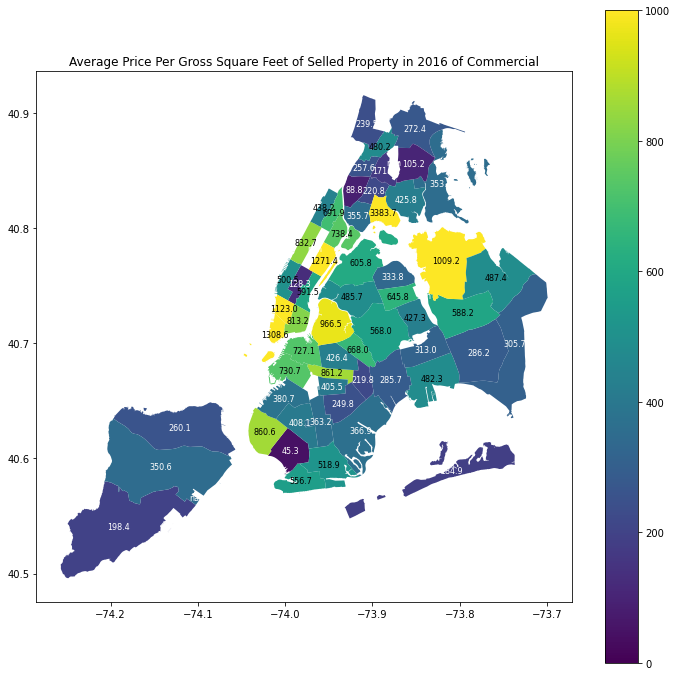

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


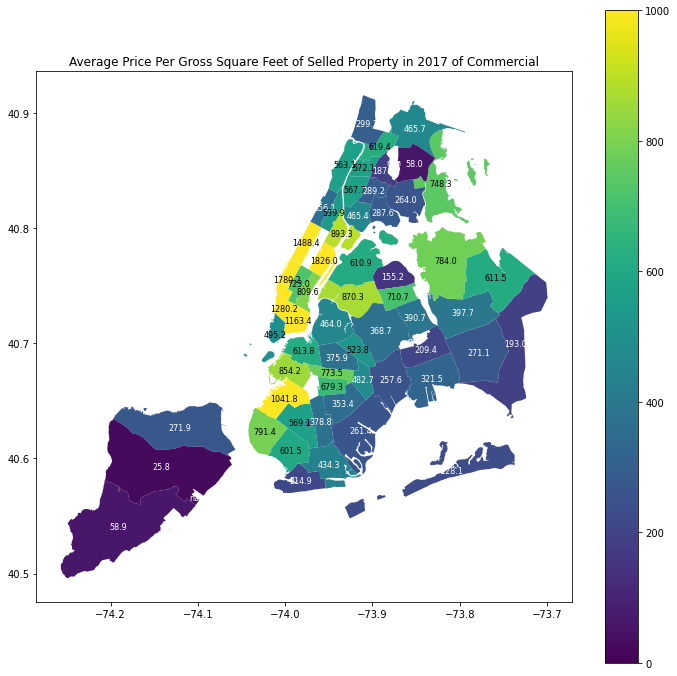

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


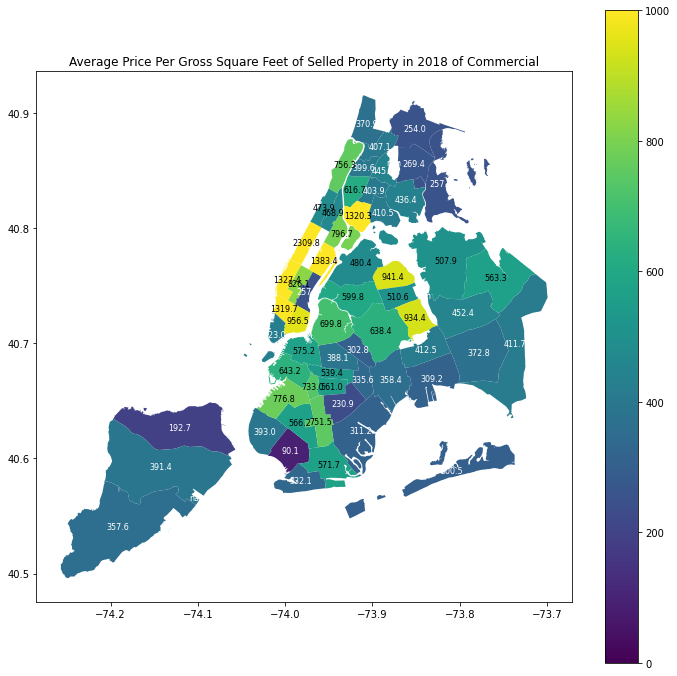

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


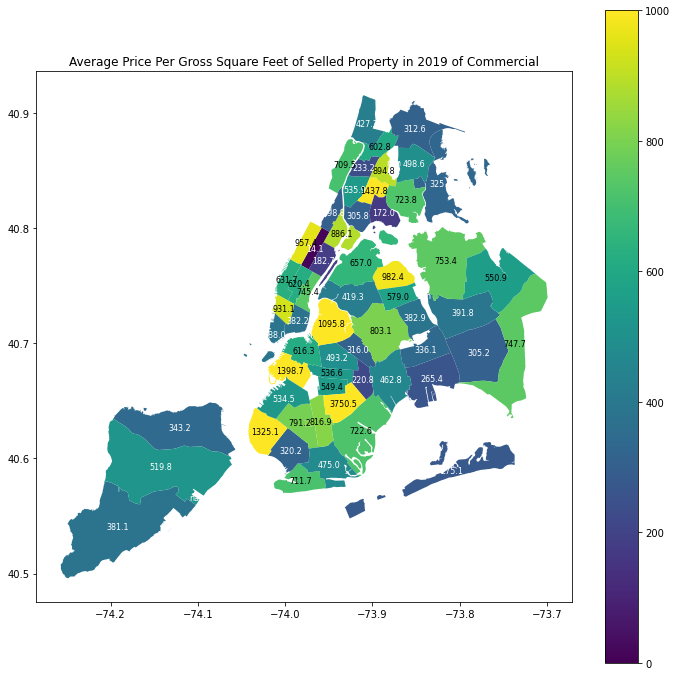

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


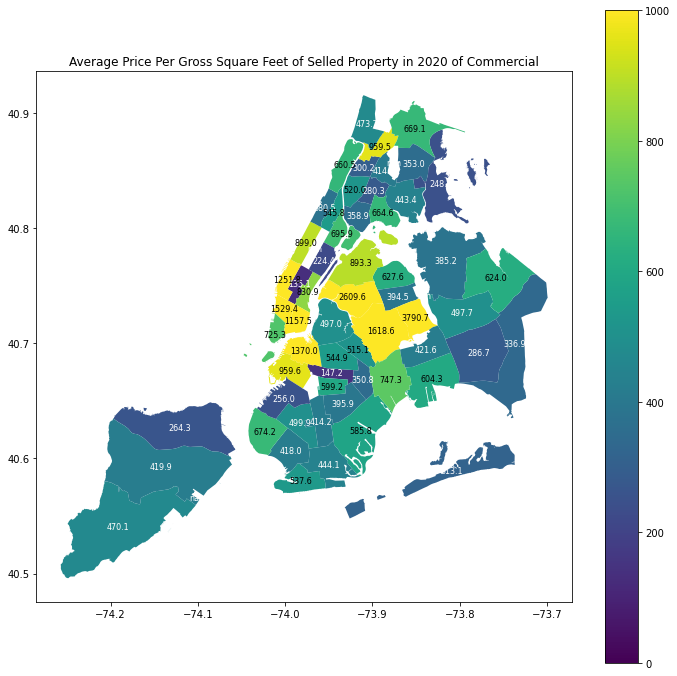

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


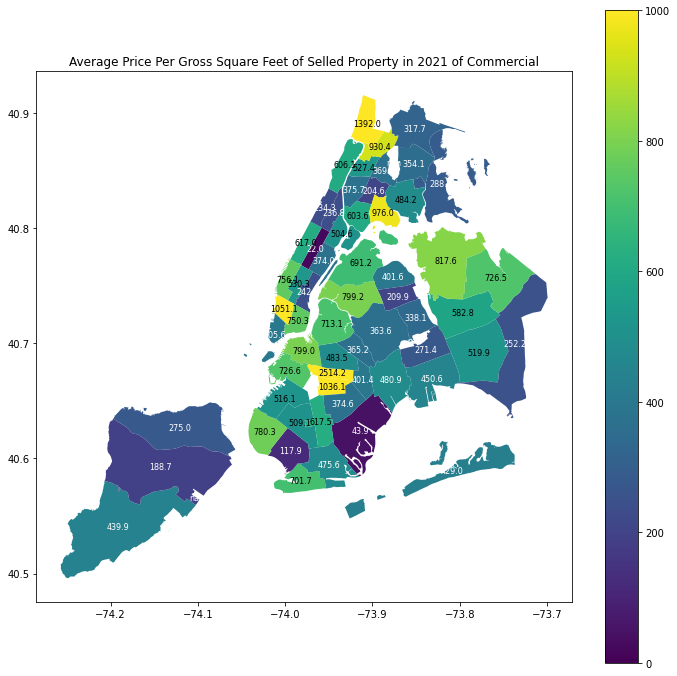

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


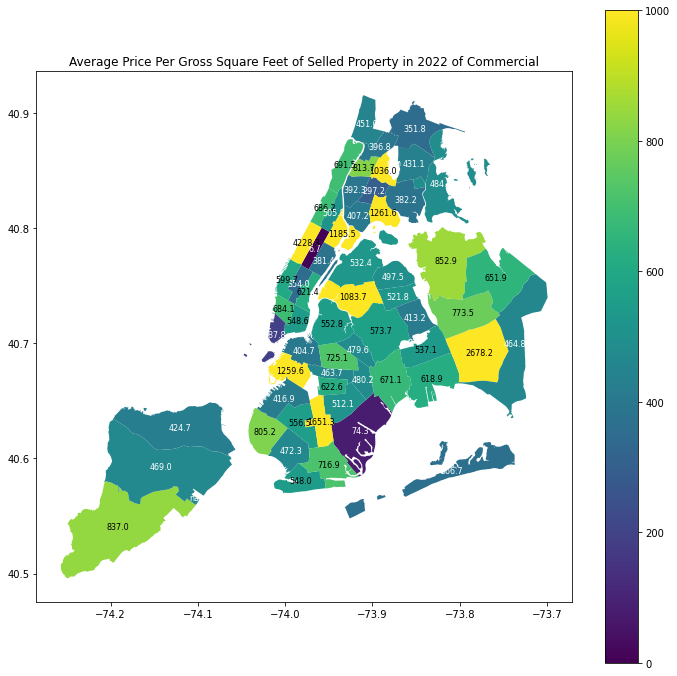

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


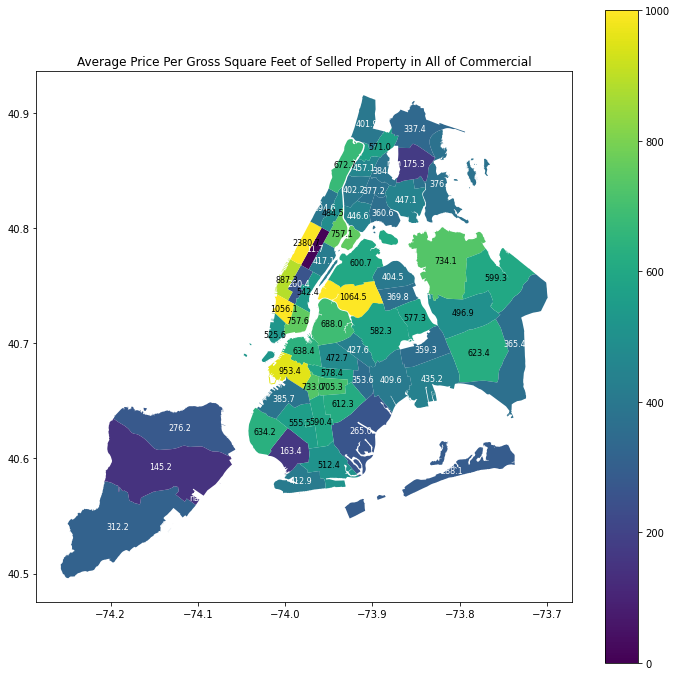

In [17]:
residential_list = ["A","B","C","D",'L','R',"S"]
house_list = ["A","B"]
apartment_list = ["C","D",'L','R',"S"]
commercial_list = ['I','H','J','K','O']
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in commercial_list)]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

for year in [2016,2017,2018,2019,2020,2021,2022,"All"]:
    draw_price_per_gross_sqft_map(gdf,gdf_points,year,"commercial".title(),0,1000)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


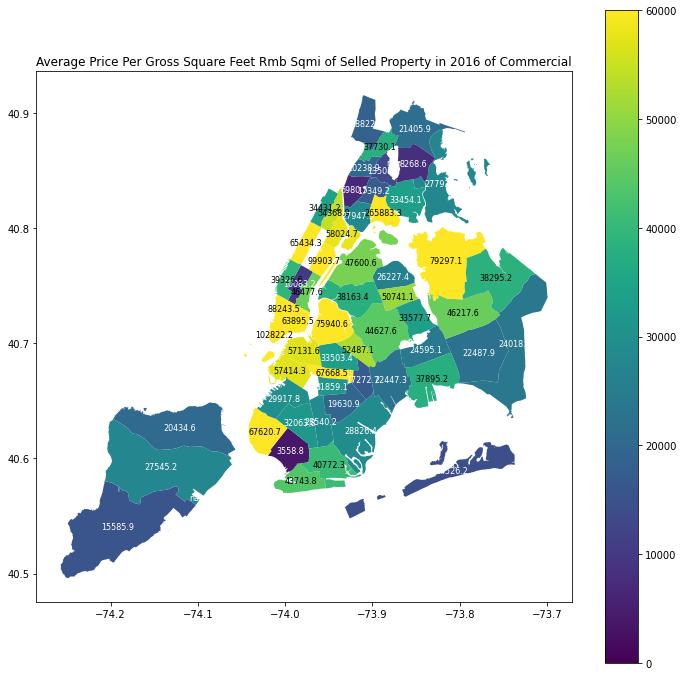

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


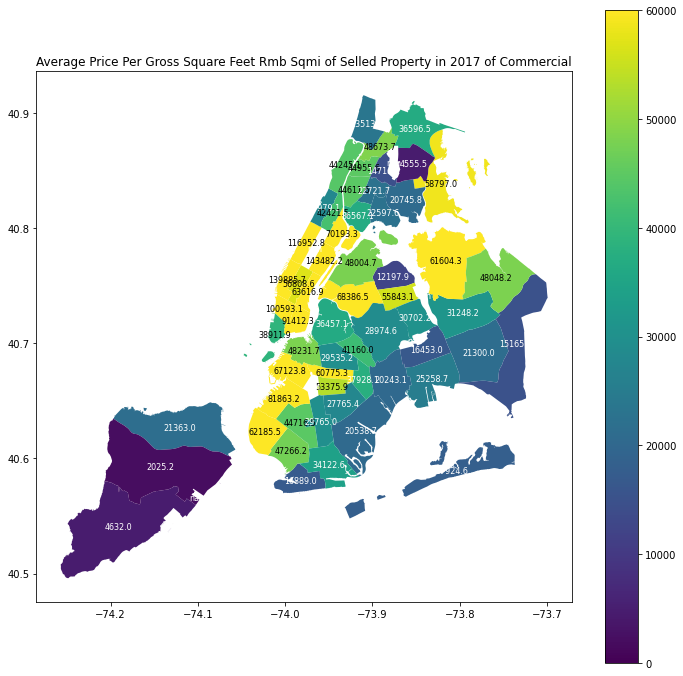

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


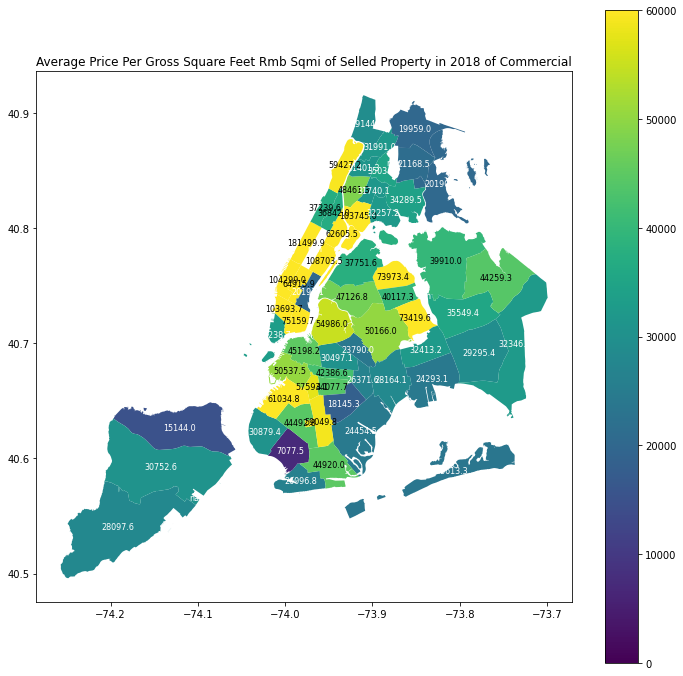

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


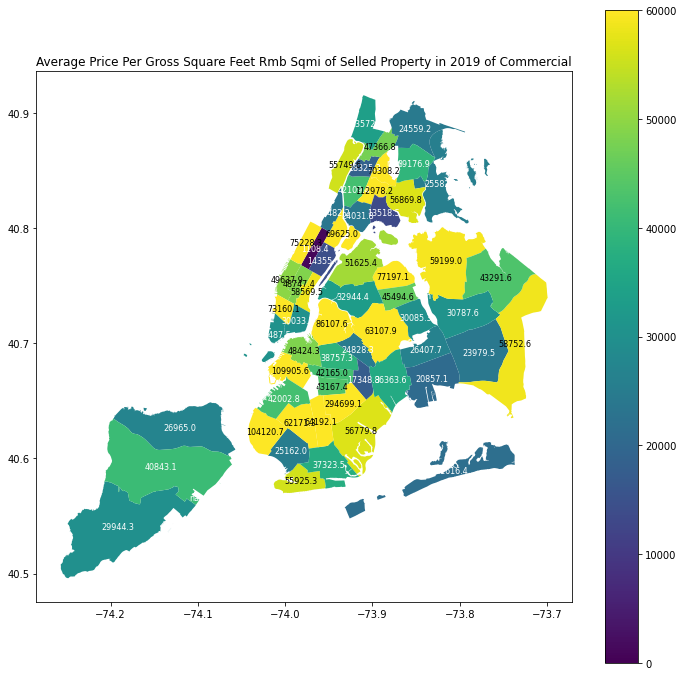

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


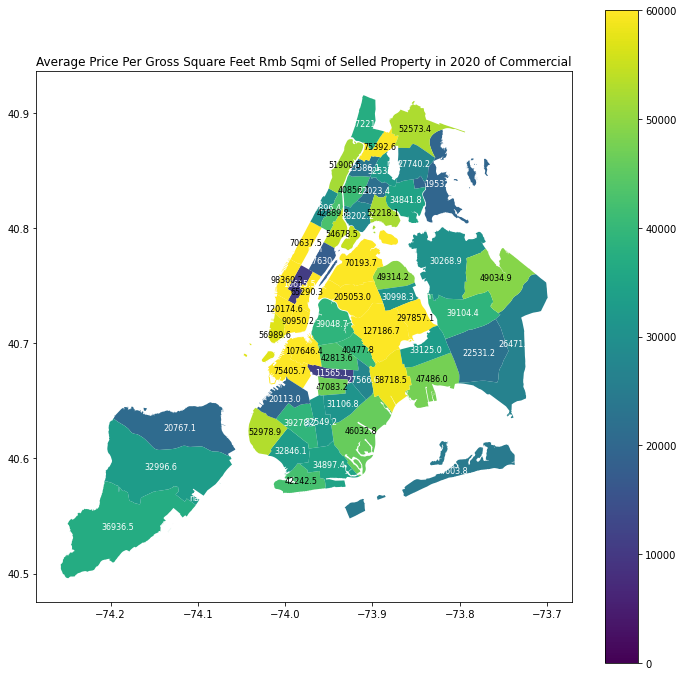

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


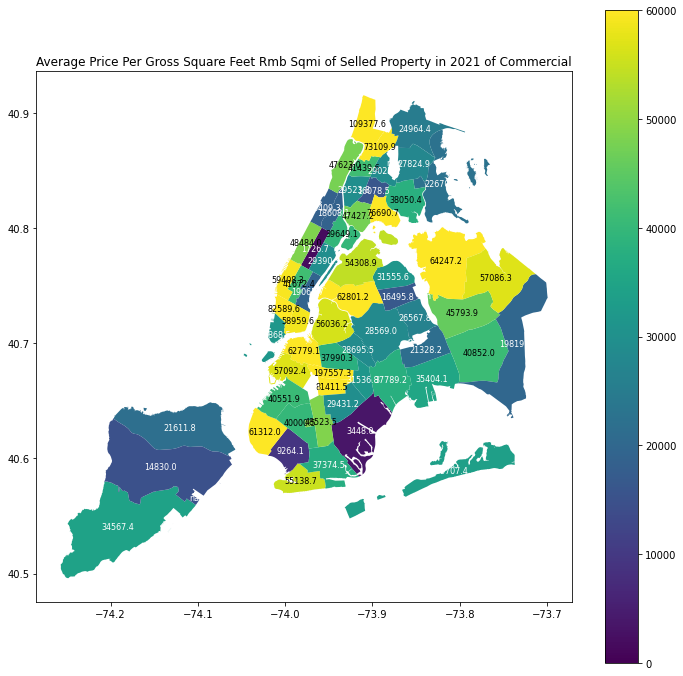

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


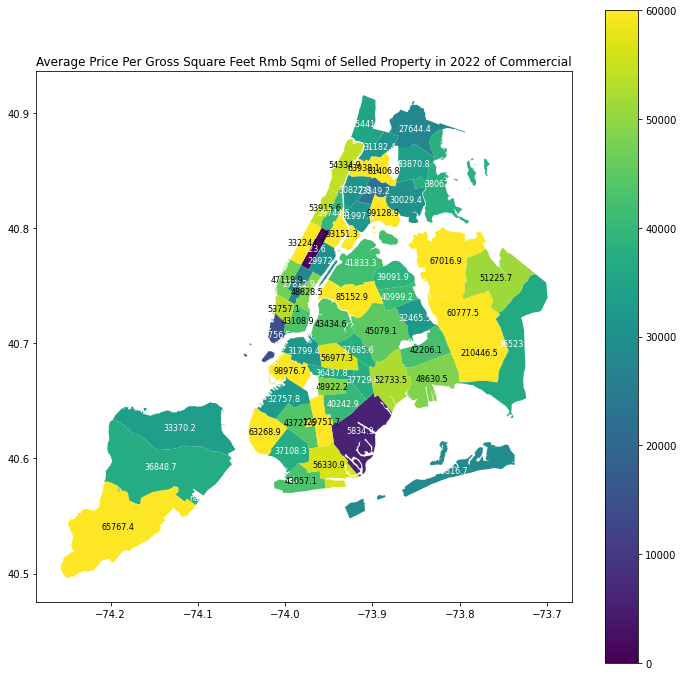

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


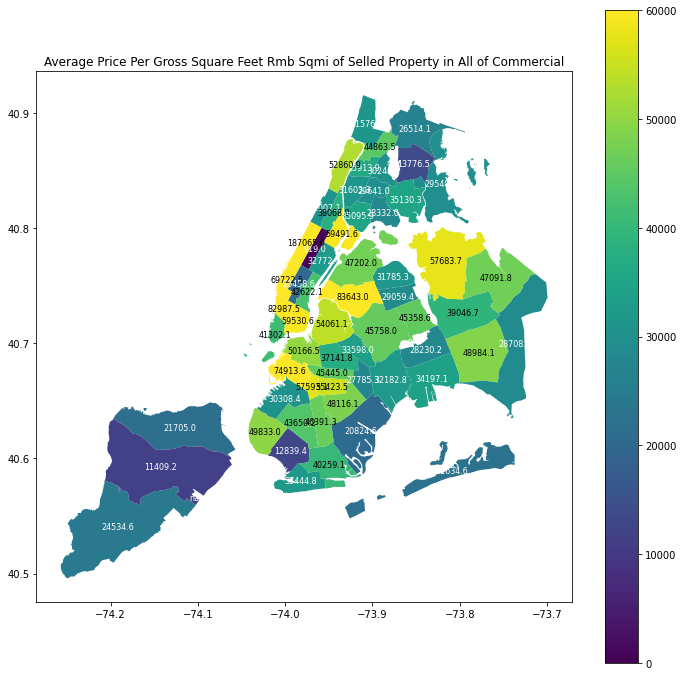

In [21]:
residential_list = ["A","B","C","D",'L','R',"S"]
house_list = ["A","B"]
apartment_list = ["C","D",'L','R',"S"]
commercial_list = ['I','H','J','K','O']
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in commercial_list)]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

for year in [2016,2017,2018,2019,2020,2021,2022,"All"]:
    draw_price_per_gross_sqft_change_unit_map(gdf,gdf_points,year,"commercial".title(),0,60000)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


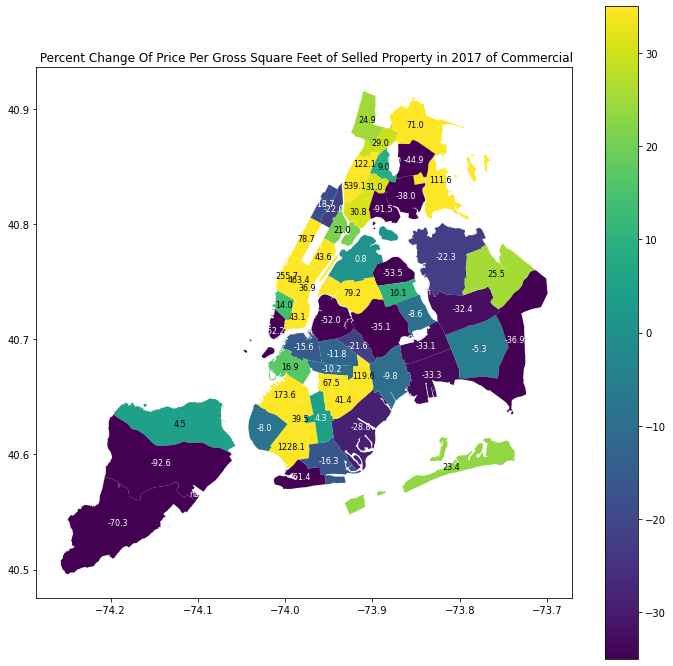

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


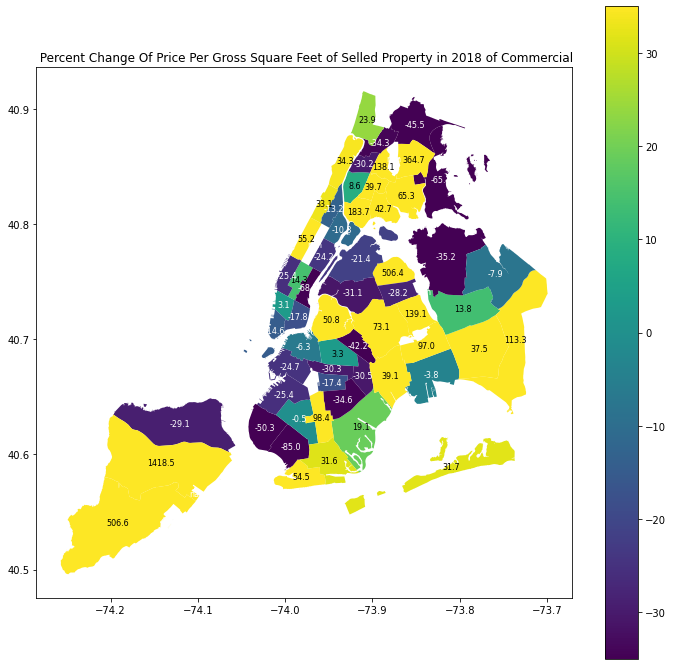

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


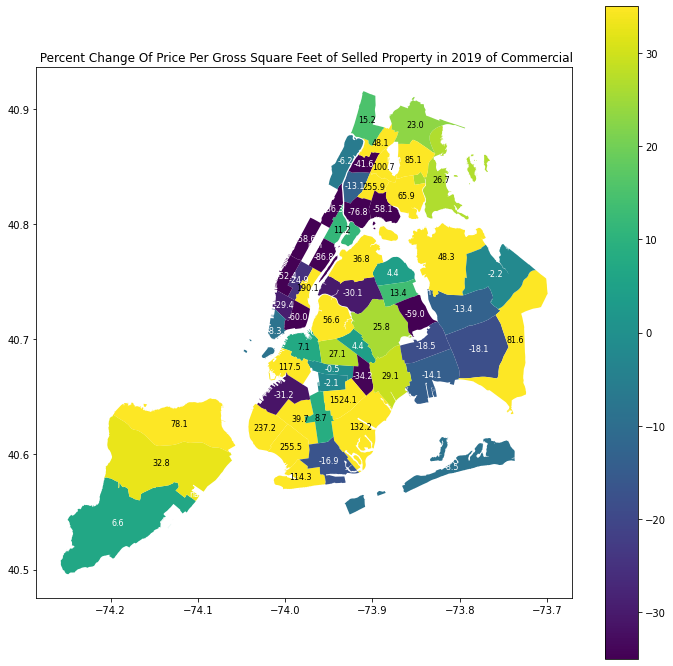

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


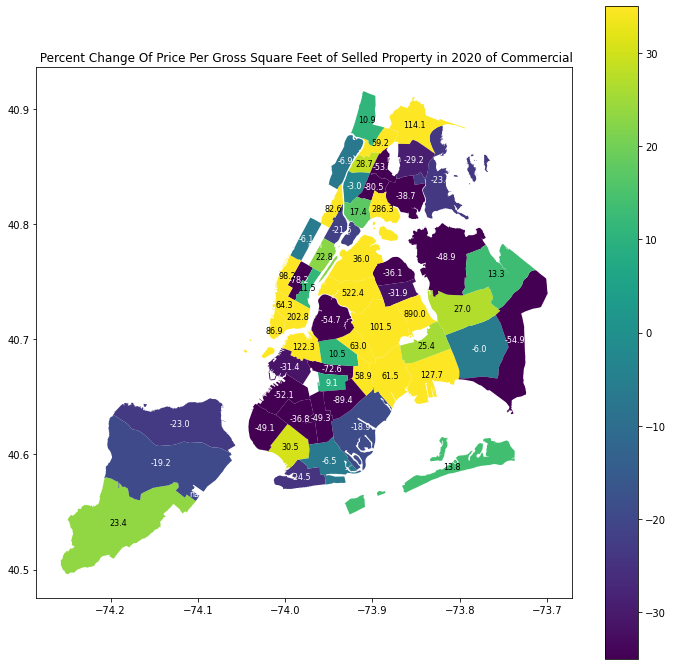

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


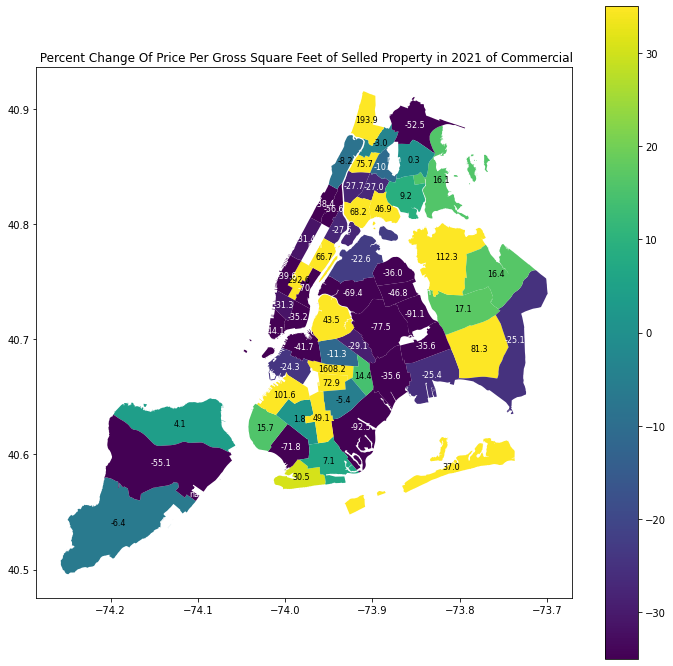

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


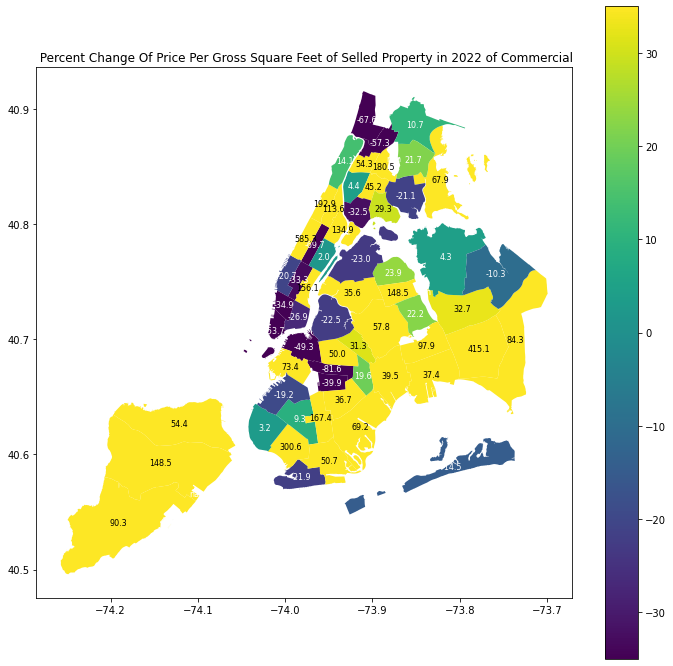

In [25]:
residential_list = ["A","B","C","D",'L','R',"S"]
house_list = ["A","B"]
apartment_list = ["C","D",'L','R',"S"]
commercial_list = ['I','H','J','K','O']
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in commercial_list)]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

for year in [2017,2018,2019,2020,2021,2022]:
    draw_price_per_gross_sqft_change_map(gdf,gdf_points,year,"commercial".title(),-35,35)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


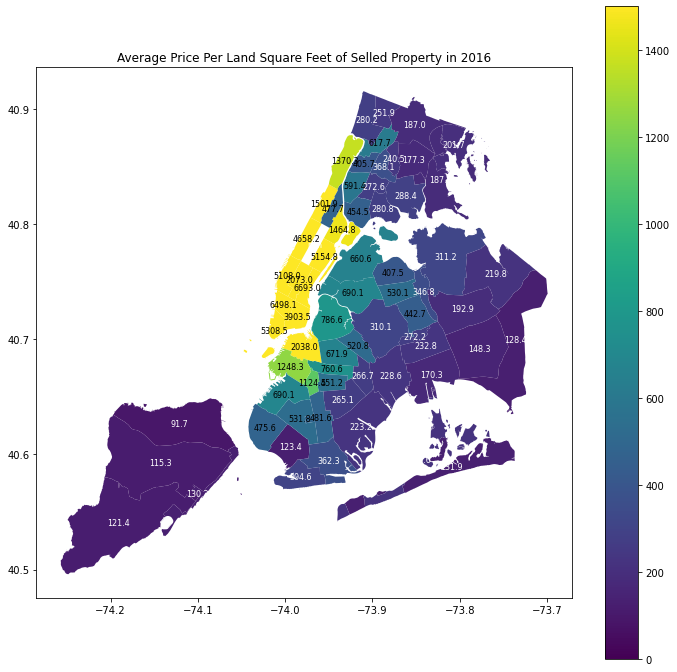

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


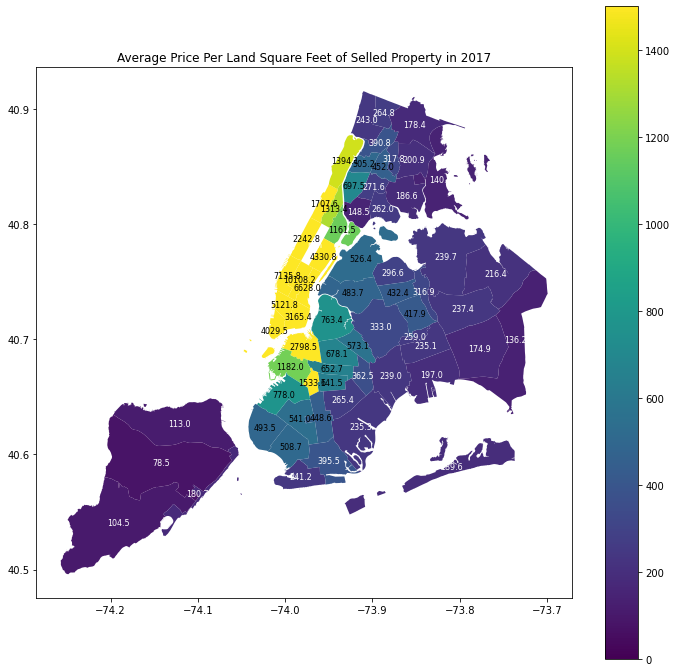

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


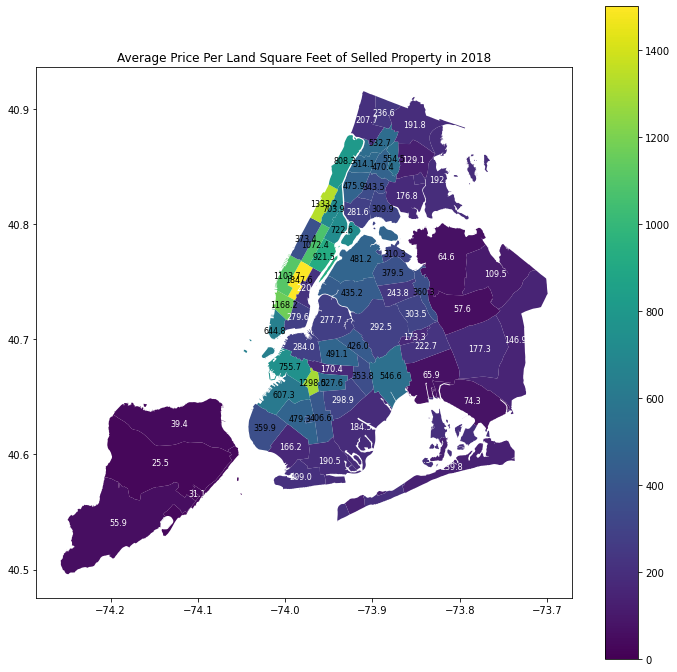

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


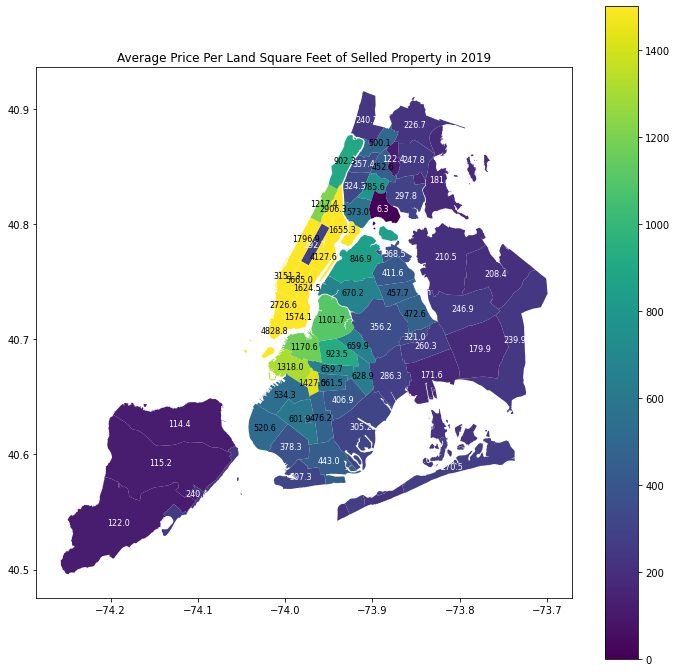

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


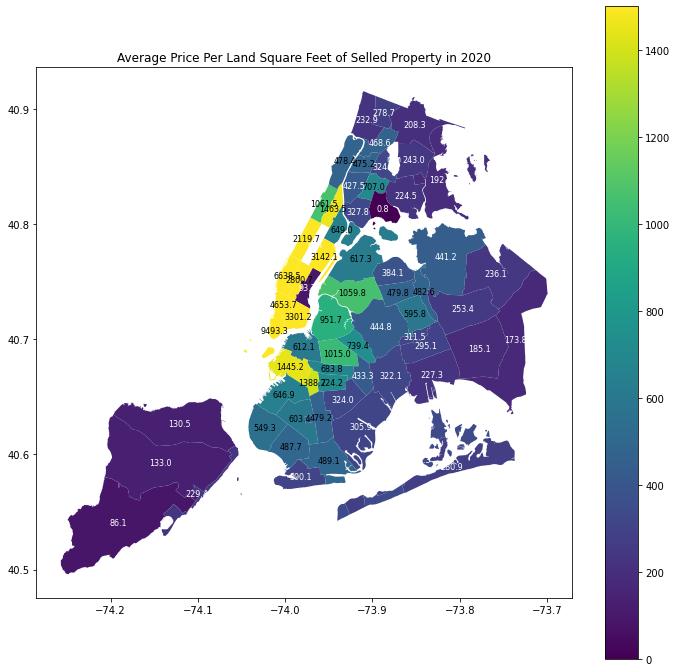

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


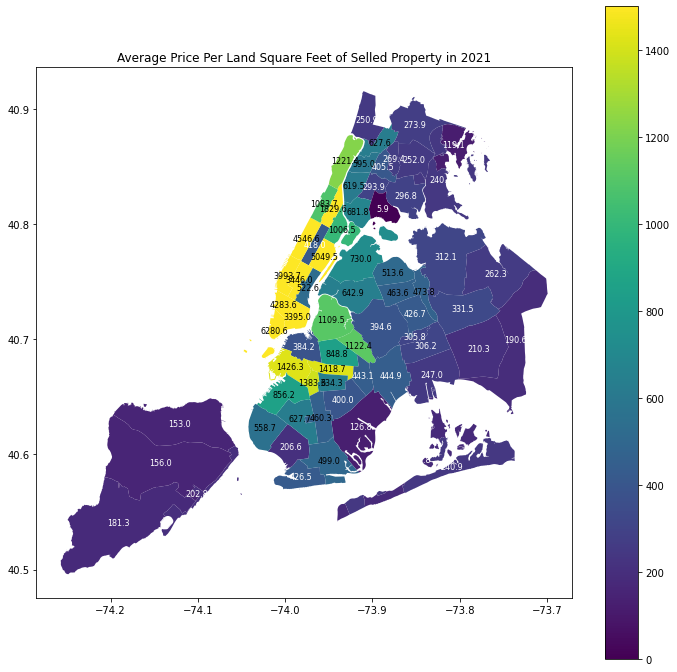

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


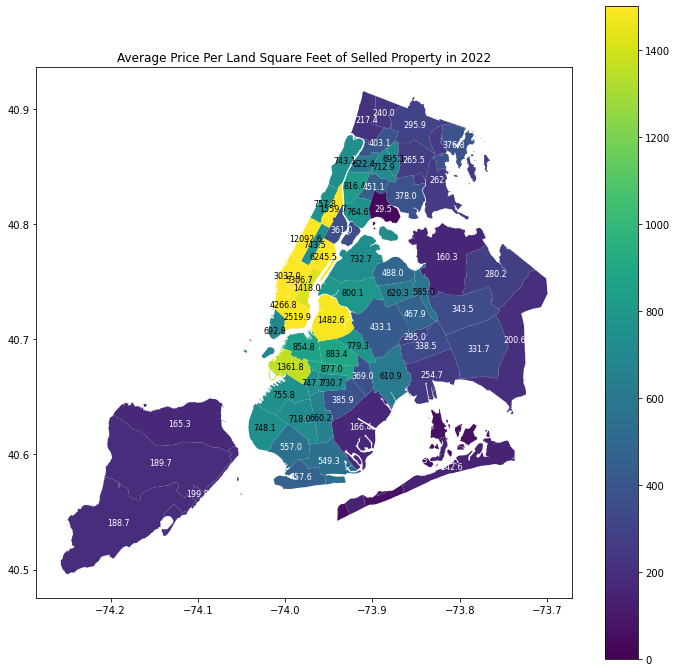

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


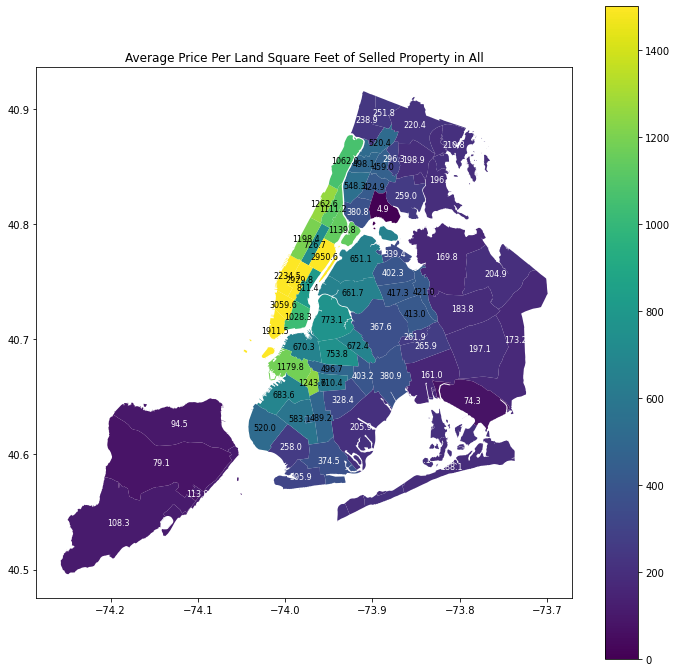

In [20]:
for year in [2016,2017,2018,2019,2020,2021,2022,"All"]:
    draw_price_per_land_sqft_map(gdf,gdf_points,year)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


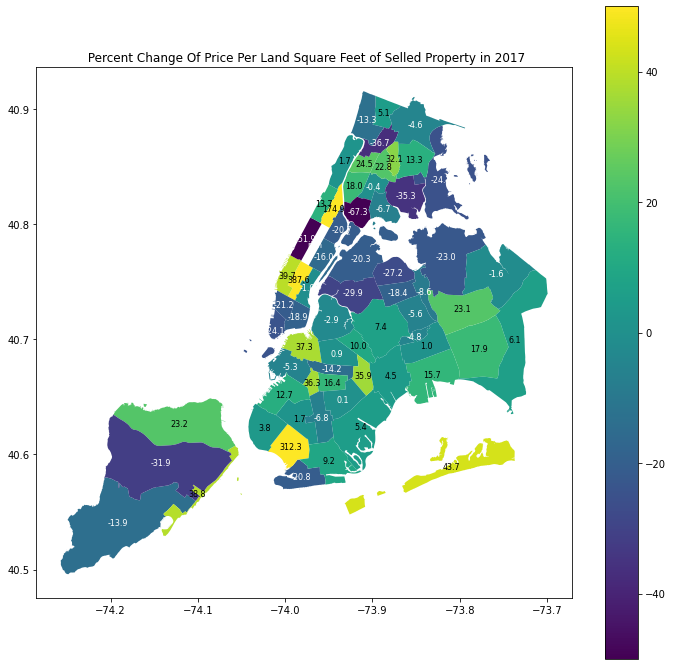

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


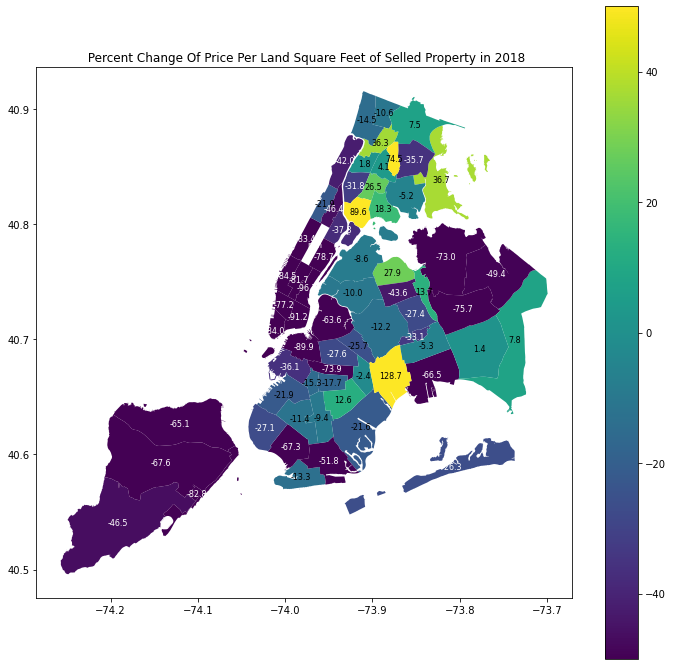

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


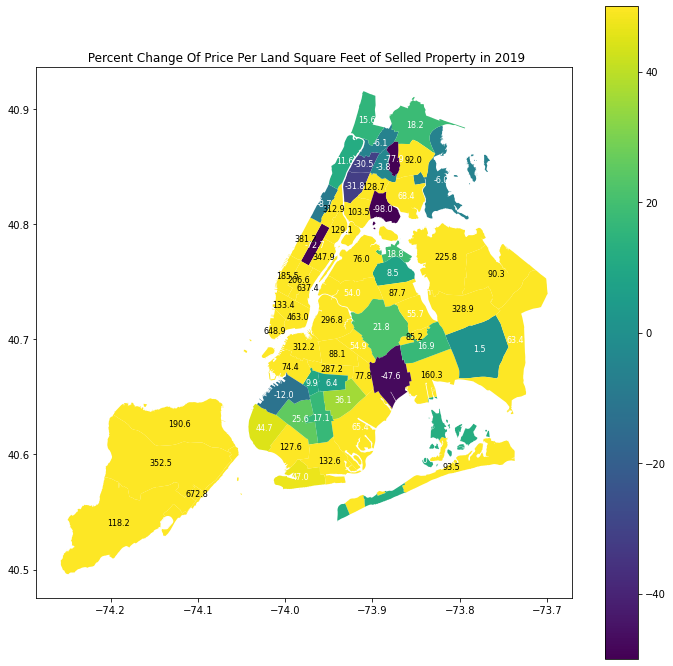

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


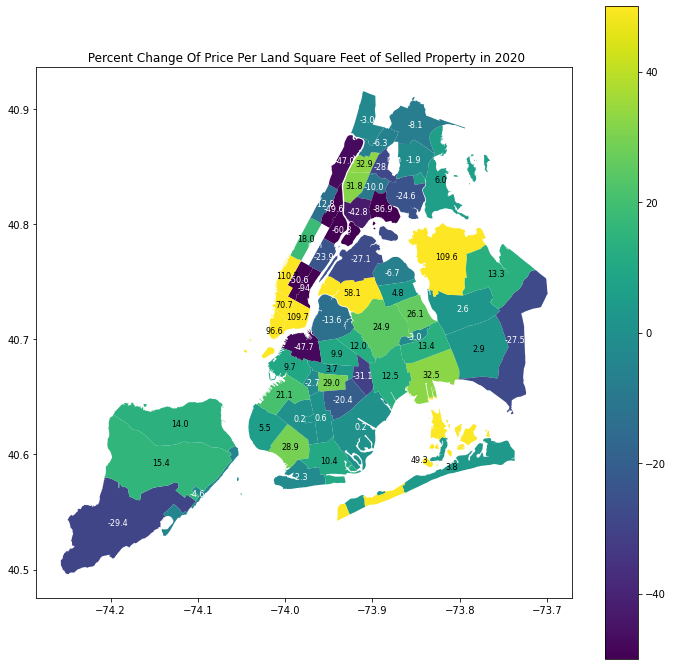

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


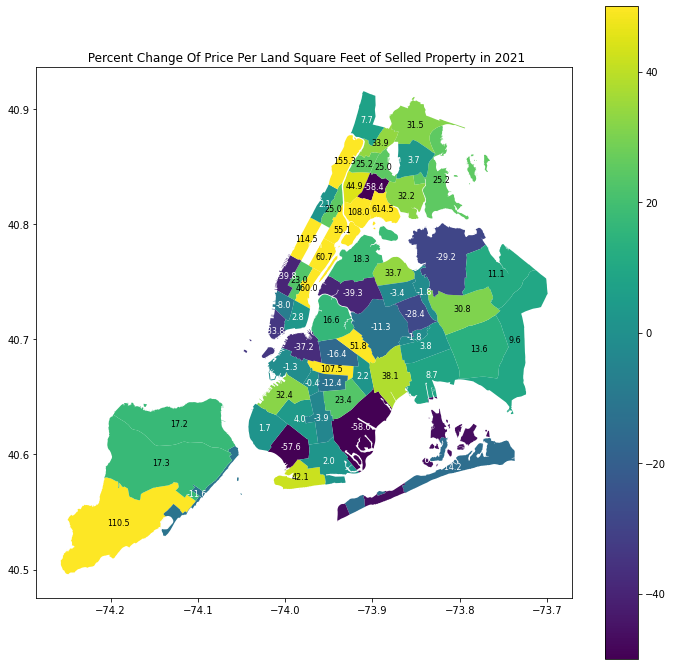

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


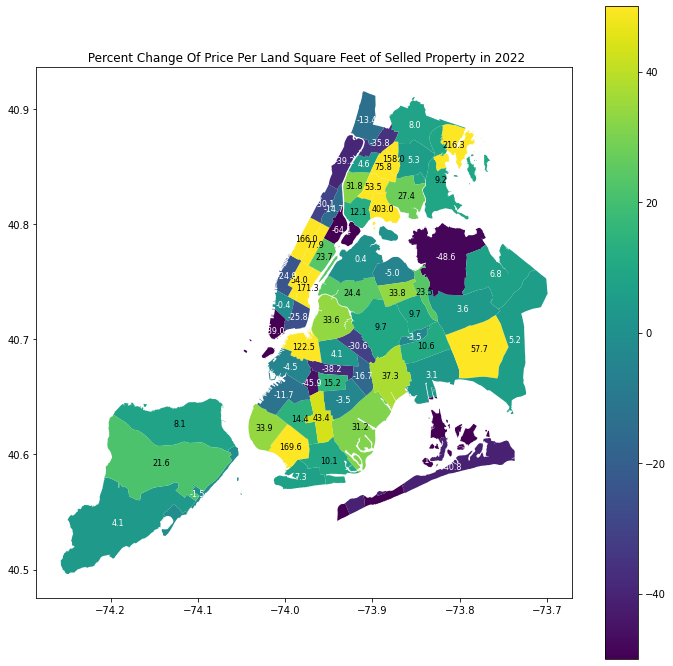

In [45]:
for year in [2017,2018,2019,2020,2021,2022]:
    draw_price_per_land_sqft_change_map(gdf,gdf_points,year)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


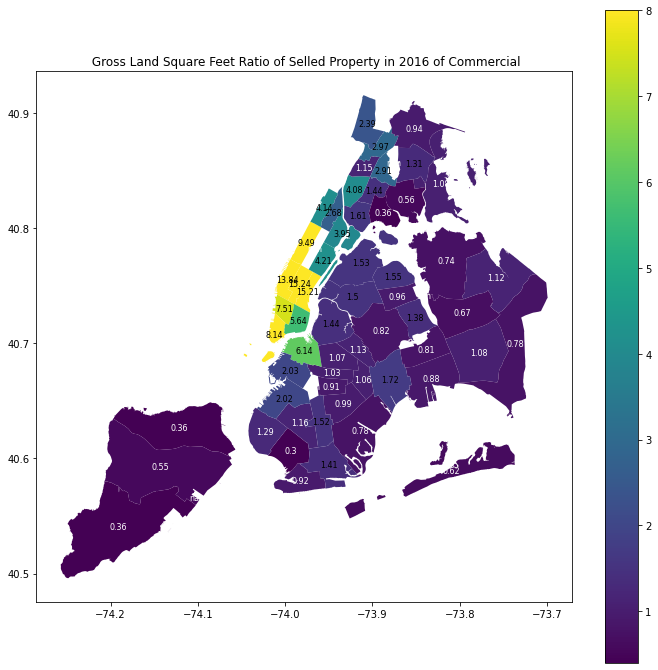

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


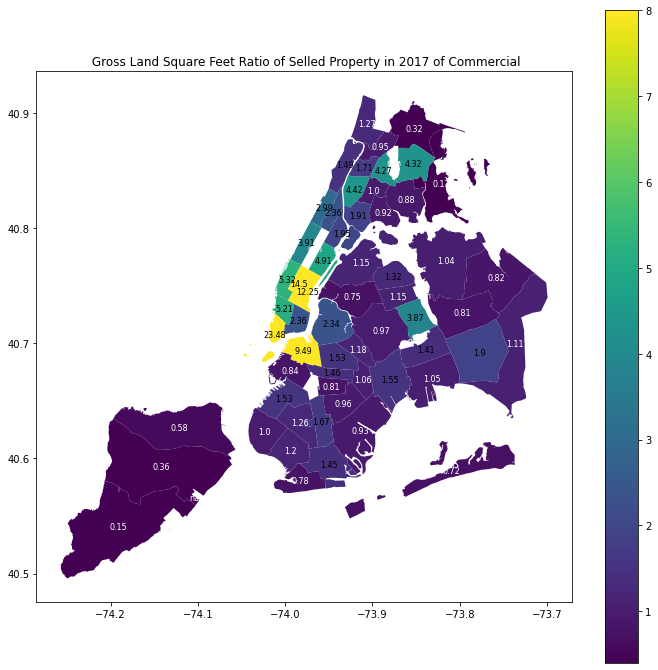

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


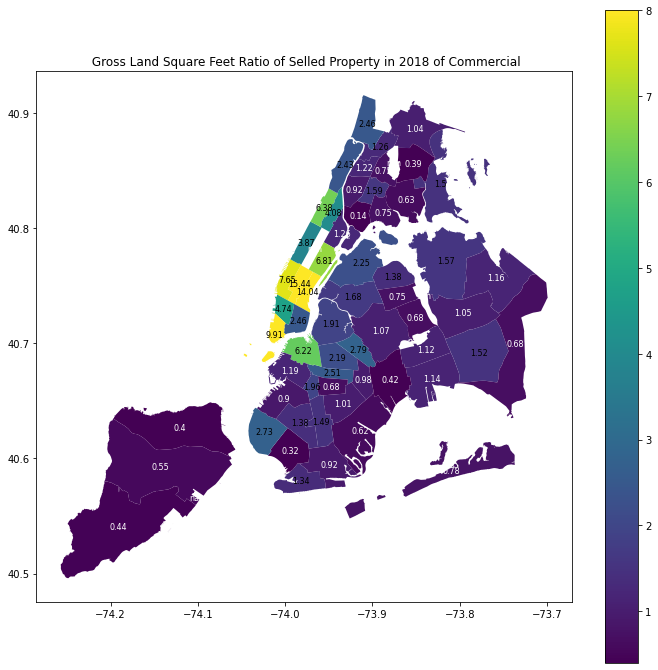

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


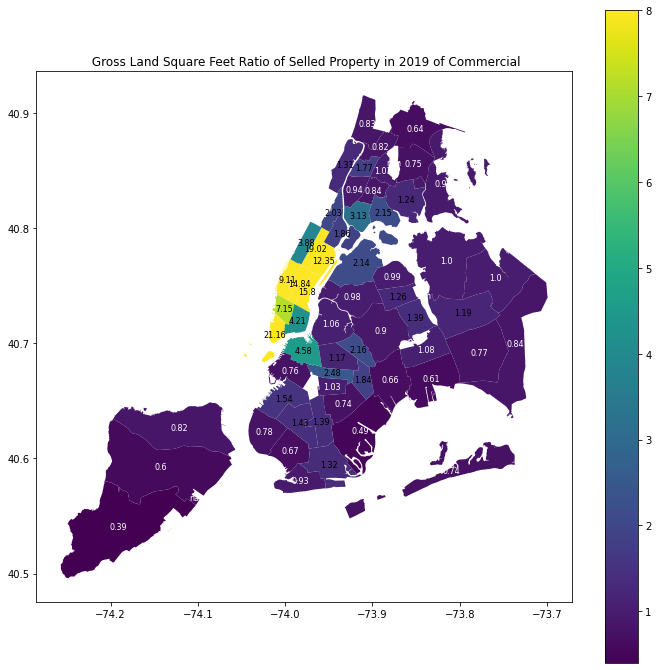

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


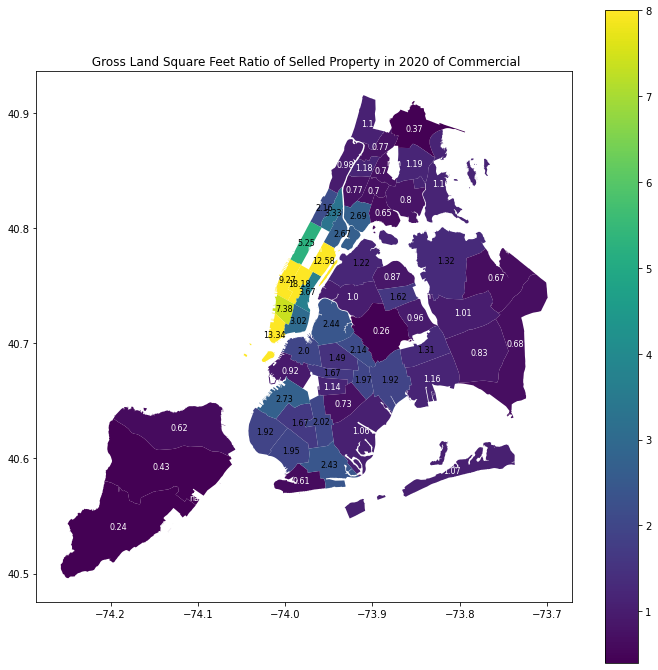

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


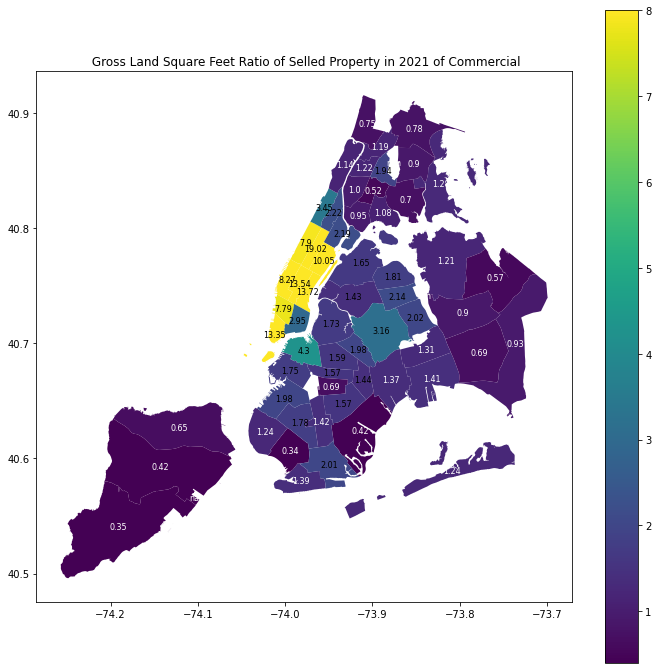

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


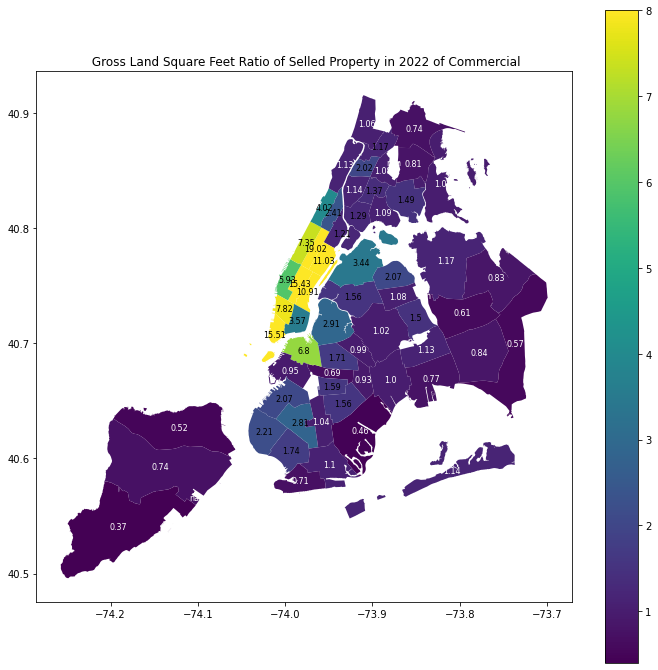

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


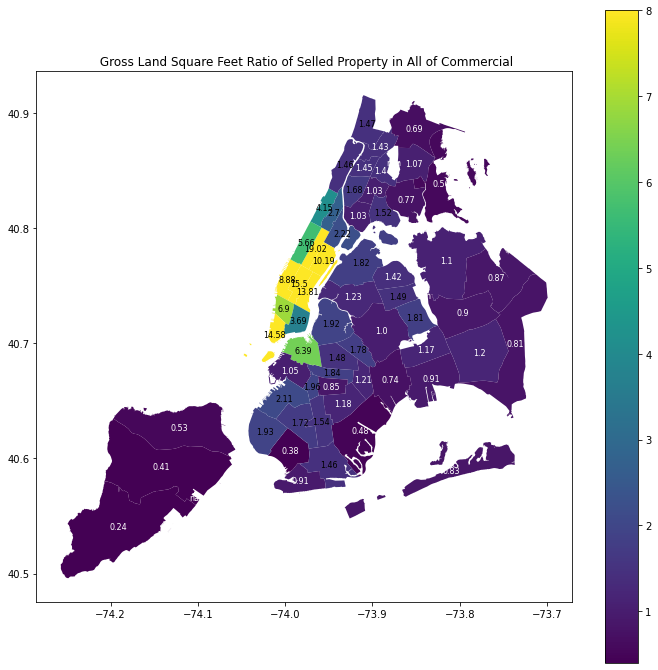

In [33]:
residential_list = ["A","B","C","D",'L','R',"S"]
house_list = ["A","B"]
apartment_list = ["C","D",'L','R',"S"]
commercial_list = ['I','H','J','K','O']
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in commercial_list)]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')

for year in [2016,2017,2018,2019,2020,2021,2022,"All"]:
    draw_gross_land_sqft_ratio_map(gdf,gdf_points,year,"commercial".title(),0.4,8)

In [34]:
residential_list = ["A","B","C","D",'L','R',"S"]
house_list = ["A","B"]
apartment_list = ["C","D",'L','R',"S"]
commercial_list = ['I','H','J','K','O']
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[df_1["BUILDING CLASS AT TIME OF SALE"].apply(lambda x: x[0] in commercial_list)]
shapefile_path = 'nycd_23d/nycd.shp'
gdf = gpd.read_file(shapefile_path)
gdf['geometry'] = gdf['geometry'].apply(modify_points)
gdf = gdf.set_geometry('geometry')
gdf.crs = 'EPSG:4326'
sub_df = df_1
geometry_points = [Point(lon, lat) for lon, lat in zip(sub_df['Longitude'], sub_df['Latitude'])]
gdf_points = gpd.GeoDataFrame(sub_df, geometry=geometry_points, crs='EPSG:4326')


for year in [2016,2017,2018,2019,2020,2021,2022]:
    draw_gross_land_sqft_ratio_change_map(gdf,gdf_points,year,"commercial".title(),-10,10)

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3369: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\D

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_price_over_time(df):
    # Convert 'SALE DATE' to datetime format
    df['SALE DATE'] = pd.to_datetime(df['SALE DATE'])

    # Extract year and month from 'SALE DATE'
    df['YearMonth'] = df['SALE DATE'].dt.to_period('M')
    plt.figure(figsize=(12, 6))
    grouped_df = df.groupby(['YearMonth'])[["LAND SQUARE FEET","SALE PRICE"]].sum().reset_index()
    grouped_df['PRICE PER LAND SQUARE FEET'] = grouped_df['SALE PRICE']/grouped_df['LAND SQUARE FEET']
    grouped_df['YearMonth'] = grouped_df['YearMonth'].astype(str)
    plt.plot(grouped_df['YearMonth'], grouped_df["PRICE PER LAND SQUARE FEET"], label="Median PRICE PER LAND SQUARE FEET".title())
    grouped_df = df.groupby(['YearMonth'])[["GROSS SQUARE FEET","SALE PRICE"]].sum().reset_index()
    grouped_df['PRICE PER GROSS SQUARE FEET'] = grouped_df['SALE PRICE']/grouped_df['GROSS SQUARE FEET']
    grouped_df['YearMonth'] = grouped_df['YearMonth'].astype(str)
    plt.plot(grouped_df['YearMonth'], grouped_df["PRICE PER GROSS SQUARE FEET"], label="Median PRICE PER GROSS SQUARE FEET".title())
    plt.title(title:=f'Median Price Over Time')
    plt.xlabel('Year-Month')
    plt.ylabel(f'Price')
    plt.ylim([0, 1000])
    plt.xticks(rotation=45, ha='right')

    # Display fewer x-axis labels
    plt.xticks(grouped_df['YearMonth'][::3])

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)
    plt.show()

import pandas as pd
import matplotlib.pyplot as plt

def plot_times_over_time(df):
    df['SALE DATE'] = pd.to_datetime(df['SALE DATE'])
    df['YearMonth'] = df['SALE DATE'].dt.to_period('M')
    plt.figure(figsize=(12, 6))
    grouped_df = df.groupby(['YearMonth']).count().reset_index()
    grouped_df['YearMonth'] = grouped_df['YearMonth'].astype(str)
    plt.plot(grouped_df['YearMonth'], grouped_df.iloc[:,1], label="Sales Times".title())
    plt.title(title:=f'Sales Times Over Time')
    plt.xlabel('Year-Month')
    plt.ylabel(f'Price')
    plt.ylim([0, 10000])
    plt.xticks(rotation=45, ha='right')

    # Display fewer x-axis labels
    plt.xticks(grouped_df['YearMonth'][::3])

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)
    plt.show()


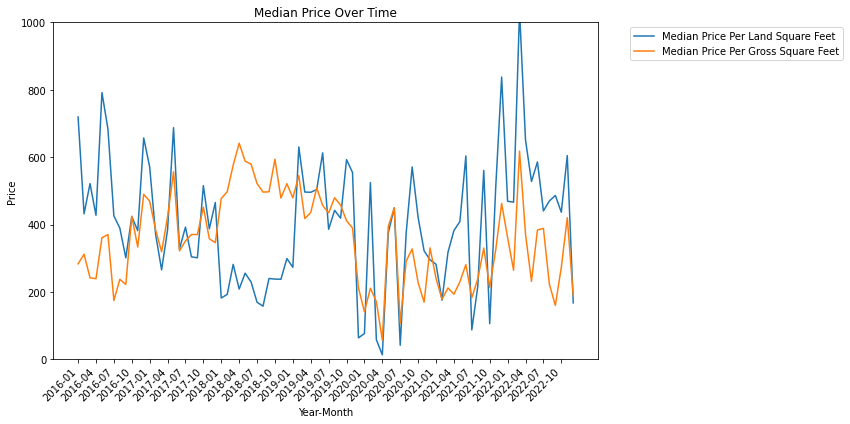

In [19]:
plot_price_over_time(df_1)

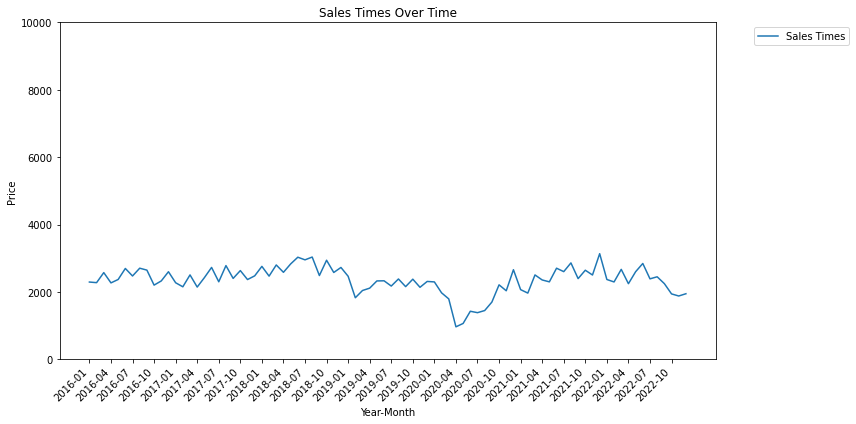

In [23]:
plot_times_over_time(df_1)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_x_by_y(df,x,y,category,ylim,interval=1):
    # Convert 'SALE DATE' to datetime format
    df['SALE DATE'] = pd.to_datetime(df['SALE DATE'])

    # Extract year and month from 'SALE DATE'
    df['YearMonth'] = df['SALE DATE'].dt.to_period('M')
    if y == 'BUILDING CLASS AT TIME OF SALE':
        df[y] = df[y].str.get(0).map(building_class_dict)
        residential_list = ['ONE FAMILY DWELLINGS', 'TWO FAMILY DWELLINGS', 'WALK UP APARTMENTS', 'PRIMARILY RES. - MIXED USE', 'CONDOMINIUMS', 'ELEVATOR APARTMENTS', 'LOFTS']
        if category == "residential":
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in residential_list][:6]
        elif category == "non-residential":
            non_residential_list = set(df[y].value_counts().to_dict().keys()) - set(residential_list)
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in non_residential_list][:6]
    if y == 'BUILDING CLASS CATEGORY':
        df[y] = df[y].replace(r"\d+\s+","",regex=True).str.split(r'(\s)+-(\s)+').str.get(0)
        residential_list = ['ONE FAMILY DWELLINGS', 'TWO FAMILY DWELLINGS', "THREE FAMILY DWELLINGS", 'CONDOS', "RENTALS", "TAX CLASS CONDOS", "LOFT BUILDINGS"]
        if category == "residential":
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in residential_list][:6]
        elif category == "non-residential":
            non_residential_list = set(df[y].value_counts().to_dict().keys()) - set(residential_list)
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in non_residential_list][:6]
    # Group by 'YearMonth' and 'BUILDING CLASS CATEGORY', calculate the average PRICE PER LAND SQUARE FEET
    grouped_df = df.groupby(['YearMonth', y])[x].mean().reset_index()

    # Convert 'YearMonth' to string for plotting
    grouped_df['YearMonth'] = grouped_df['YearMonth'].astype(str)

    # Pivot the table to have 'BUILDING CLASS CATEGORY' as columns
    pivot_df = grouped_df.pivot(index='YearMonth', columns=y, values=x)
    # Plotting
    plt.figure(figsize=(12, 6))

    # Plot each category as a separate line
    for column in pivot_df.columns:
        if column in column_list:
            plt.plot(pivot_df.index, pivot_df[column], label=column)

    plt.title(title:=f'Average {x.title()} Over Time of {category.title()} Buildings')
    plt.xlabel('Year-Month')
    plt.ylabel(f'Average {x.title()}')
    plt.ylim([0,ylim])
    plt.xticks(rotation=45, ha='right')

    # Display fewer x-axis labels
    plt.xticks(pivot_df.index[::3])

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)
    plt.show()


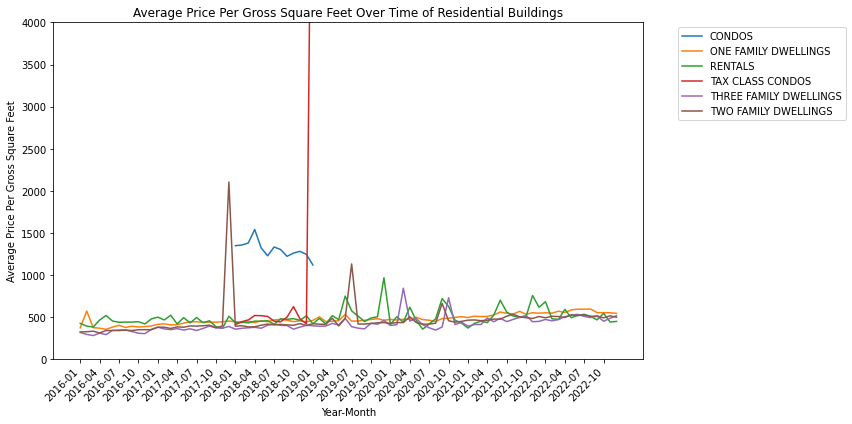

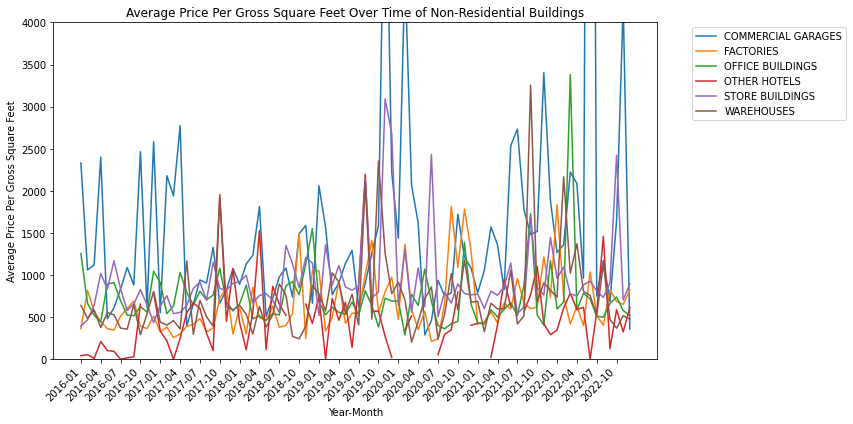

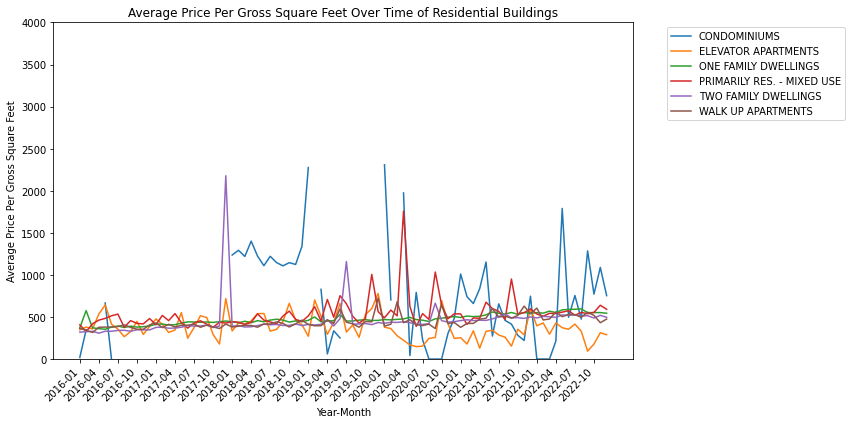

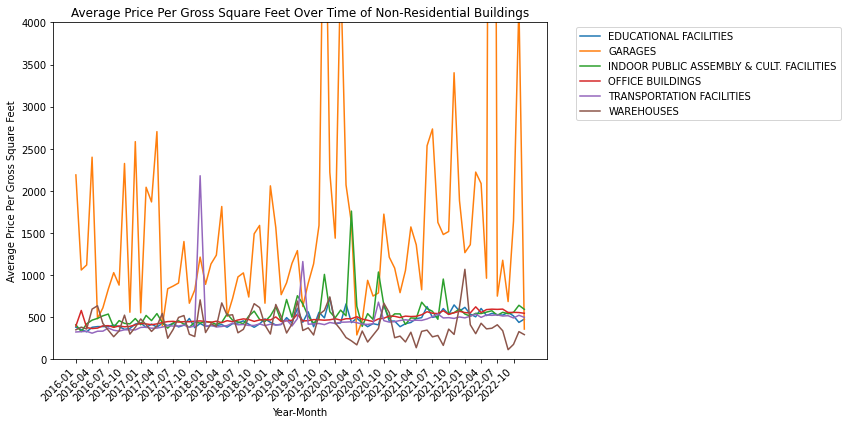

In [33]:
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]

plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS CATEGORY","residential",4000)
plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS CATEGORY","non-residential",4000)
plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS AT TIME OF SALE","residential",4000)
plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS AT TIME OF SALE","non-residential",4000)

NameError: name 'os' is not defined

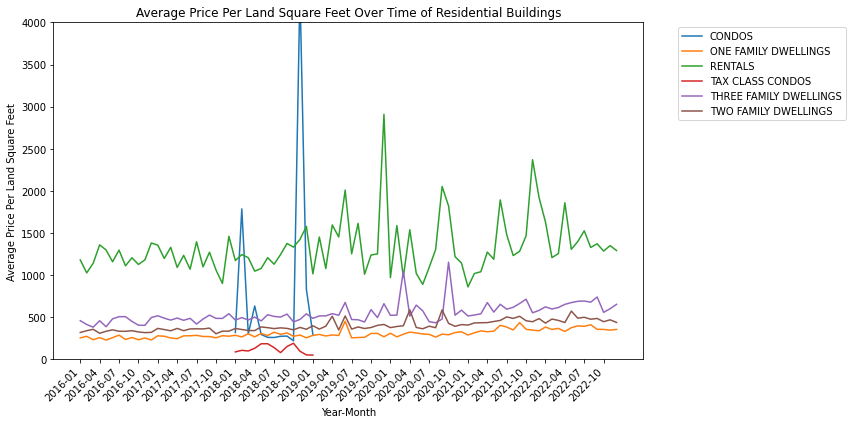

In [2]:
import os

df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]

plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS CATEGORY","residential",4000)
plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS CATEGORY","non-residential",4000)
plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS AT TIME OF SALE","residential",4000)
plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS AT TIME OF SALE","non-residential",4000)

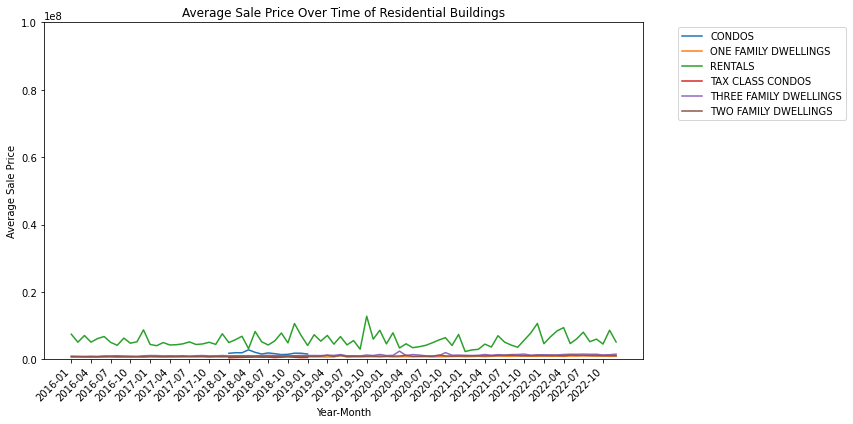

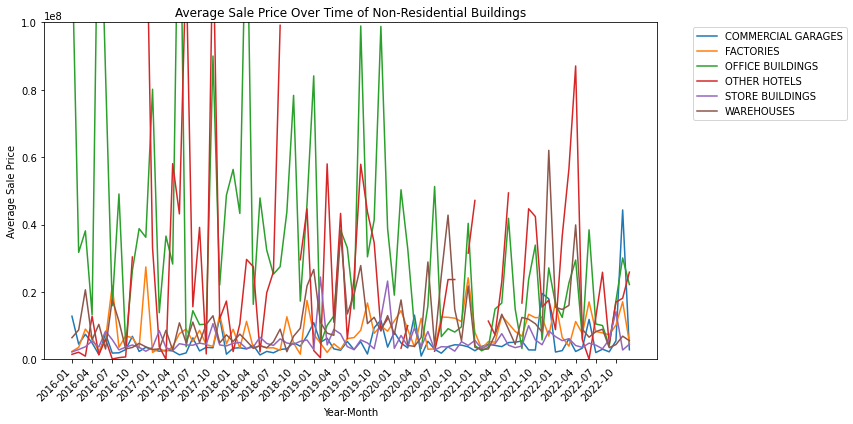

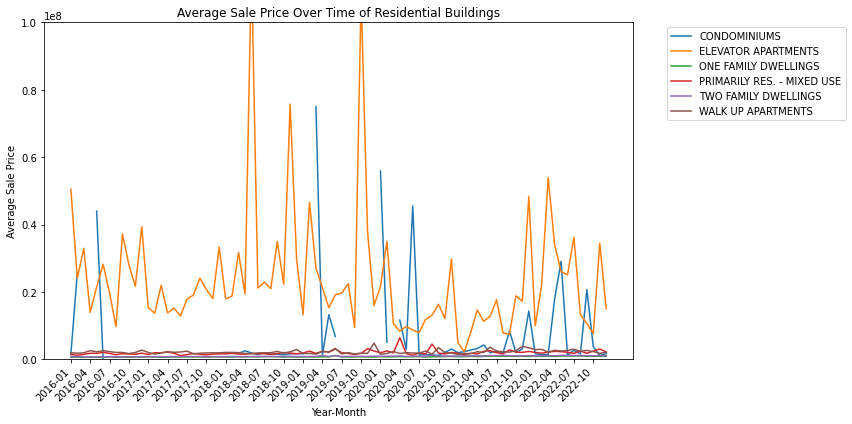

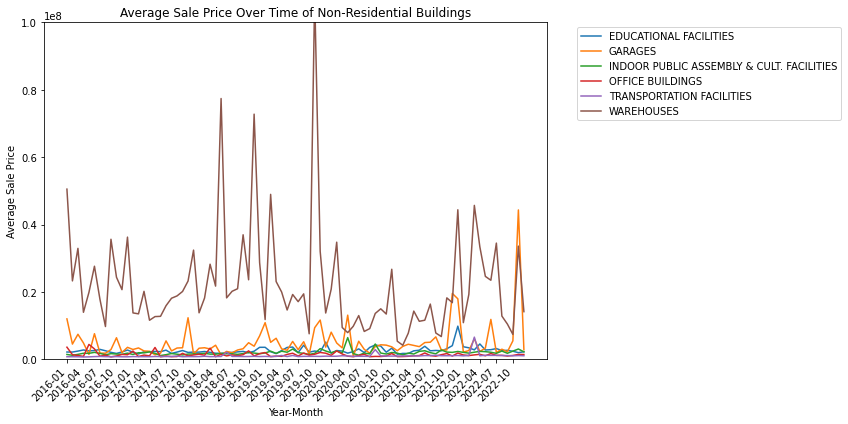

In [36]:
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]

plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS CATEGORY","residential",1e8)
plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS CATEGORY","non-residential",1e8)
plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS AT TIME OF SALE","residential",1e8)
plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS AT TIME OF SALE","non-residential",1e8)

In [37]:
def plot_x_by_y(df,x,y,category,ylim,interval=1):
    # Convert 'SALE DATE' to datetime format
    df['SALE DATE'] = pd.to_datetime(df['SALE DATE'])

    # Extract year and month from 'SALE DATE'
    df['YearMonth'] = df['SALE DATE'].dt.to_period('M')
    if y == 'BUILDING CLASS AT TIME OF SALE':
        df[y] = df[y].str.get(0).map(building_class_dict)
        residential_list = ['ONE FAMILY DWELLINGS', 'TWO FAMILY DWELLINGS', 'WALK UP APARTMENTS', 'PRIMARILY RES. - MIXED USE', 'CONDOMINIUMS', 'ELEVATOR APARTMENTS', 'LOFTS']
        if category == "residential":
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in residential_list][:6]
        elif category == "non-residential":
            non_residential_list = set(df[y].value_counts().to_dict().keys()) - set(residential_list)
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in non_residential_list][:6]
    if y == 'BUILDING CLASS CATEGORY':
        df[y] = df[y].replace(r"\d+\s+","",regex=True).str.split(r'(\s)+-(\s)+').str.get(0)
        residential_list = ['ONE FAMILY DWELLINGS', 'TWO FAMILY DWELLINGS', "THREE FAMILY DWELLINGS", 'CONDOS', "RENTALS", "TAX CLASS CONDOS", "LOFT BUILDINGS"]
        if category == "residential":
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in residential_list][:6]
        elif category == "non-residential":
            non_residential_list = set(df[y].value_counts().to_dict().keys()) - set(residential_list)
            column_list = [i for i in list(df[y].value_counts().to_dict().keys()) if i in non_residential_list][:6]
    # Group by 'YearMonth' and 'BUILDING CLASS CATEGORY', calculate the average PRICE PER LAND SQUARE FEET
    grouped_df = df.groupby(['YearMonth', y])[x].median().reset_index()

    # Convert 'YearMonth' to string for plotting
    grouped_df['YearMonth'] = grouped_df['YearMonth'].astype(str)

    # Pivot the table to have 'BUILDING CLASS CATEGORY' as columns
    pivot_df = grouped_df.pivot(index='YearMonth', columns=y, values=x)
    # Plotting
    plt.figure(figsize=(12, 6))

    # Plot each category as a separate line
    for column in pivot_df.columns:
        if column in column_list:
            plt.plot(pivot_df.index, pivot_df[column], label=column)

    plt.title(title:=f'Median {x.title()} Over Time of {category.title()} Buildings')
    plt.xlabel('Year-Month')
    plt.ylabel(f'Median {x.title()}')
    plt.ylim([0,ylim])
    plt.xticks(rotation=45, ha='right')

    # Display fewer x-axis labels
    plt.xticks(pivot_df.index[::3])

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)
    plt.show()

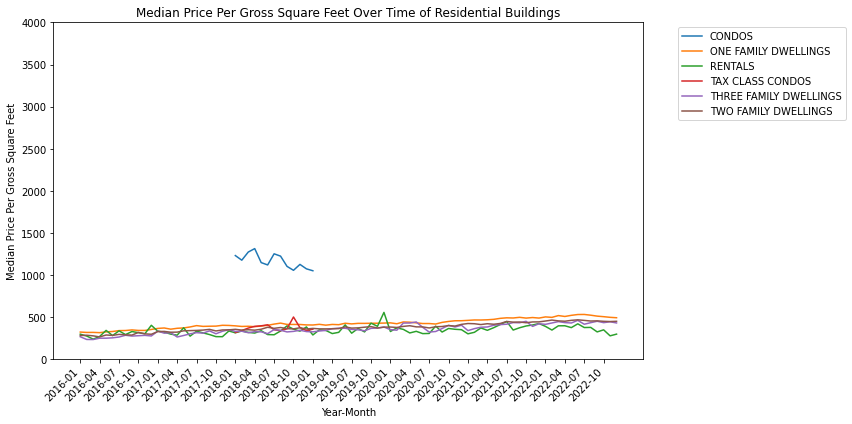

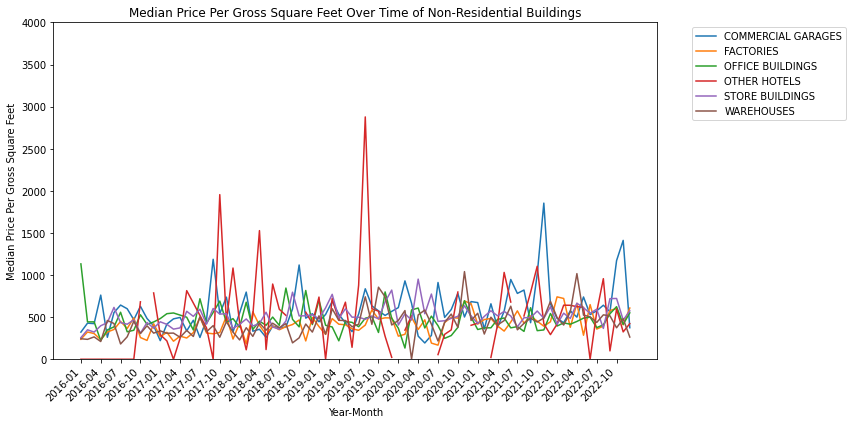

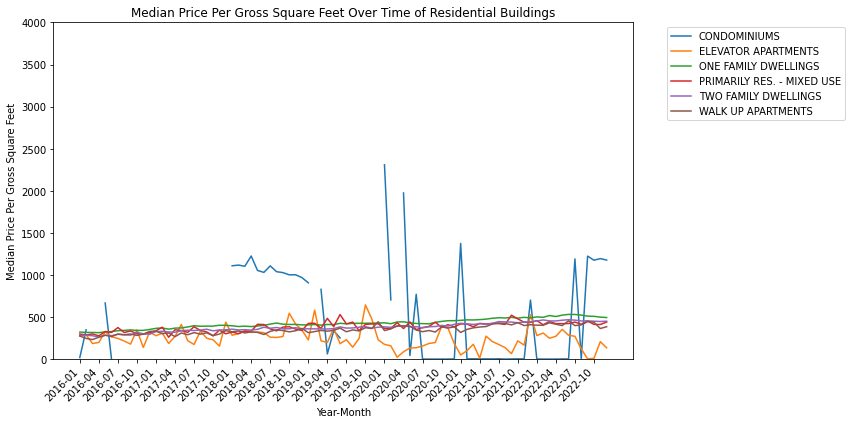

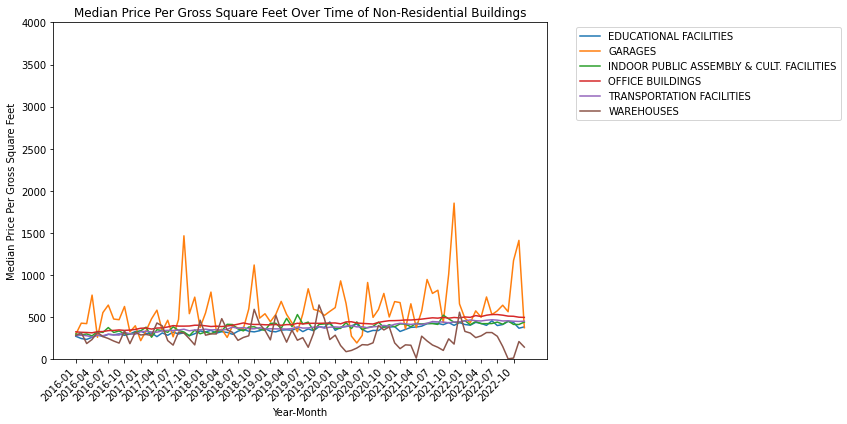

In [39]:
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]


plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS CATEGORY","residential",4000)
plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS CATEGORY","non-residential",4000)
plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS AT TIME OF SALE","residential",4000)
plot_x_by_y(df_1,"PRICE PER GROSS SQUARE FEET","BUILDING CLASS AT TIME OF SALE","non-residential",4000)

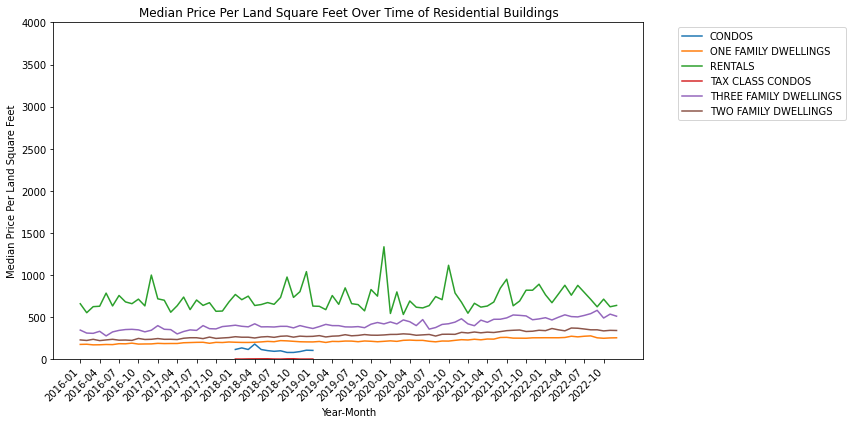

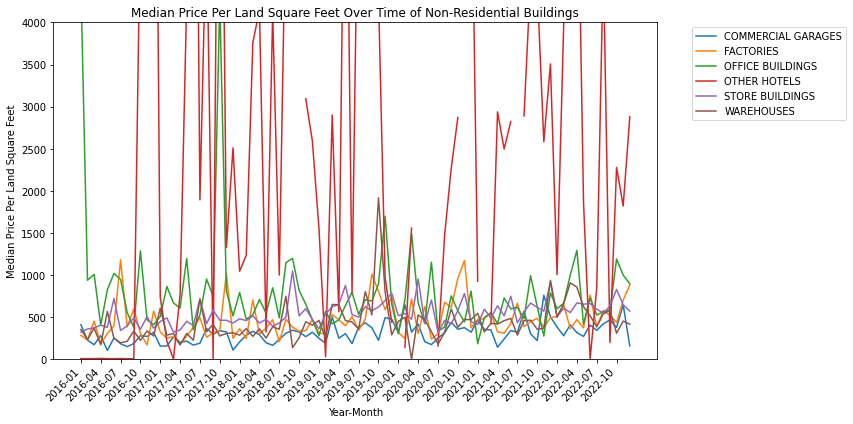

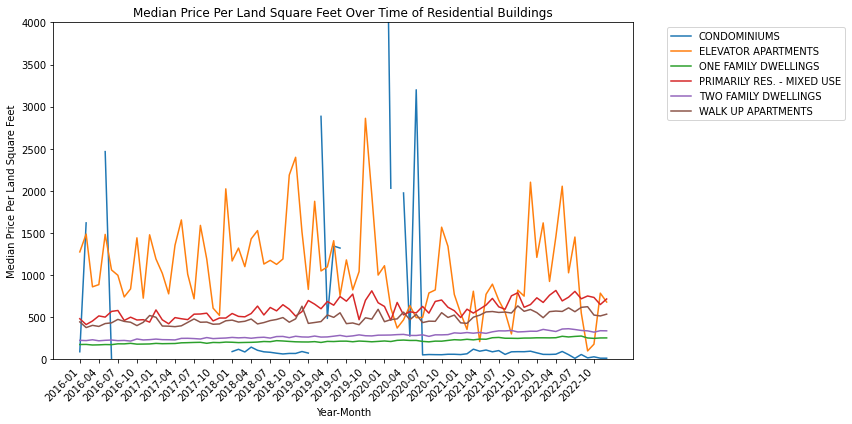

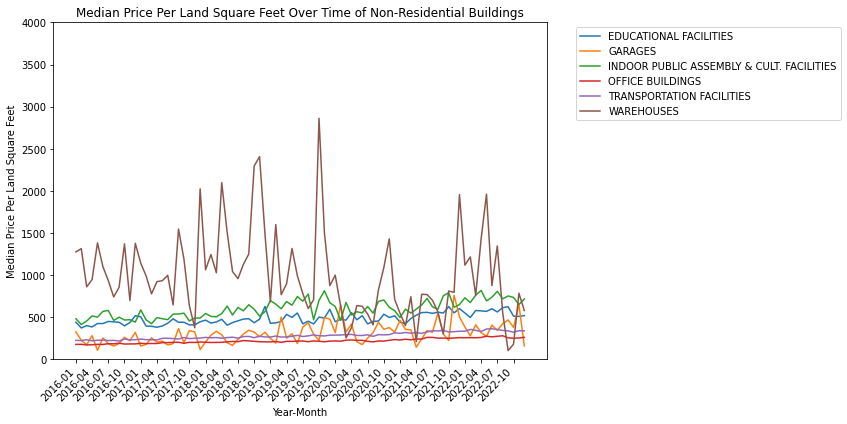

In [40]:
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]

plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS CATEGORY","residential",4000)
plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS CATEGORY","non-residential",4000)
plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS AT TIME OF SALE","residential",4000)
plot_x_by_y(df_1,"PRICE PER LAND SQUARE FEET","BUILDING CLASS AT TIME OF SALE","non-residential",4000)

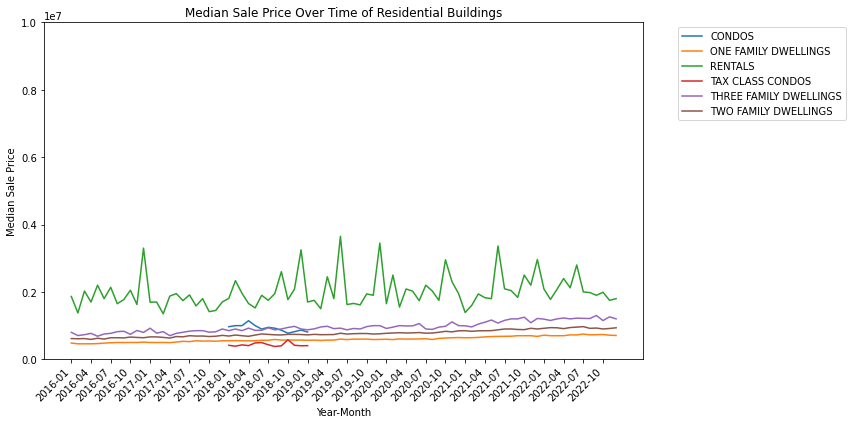

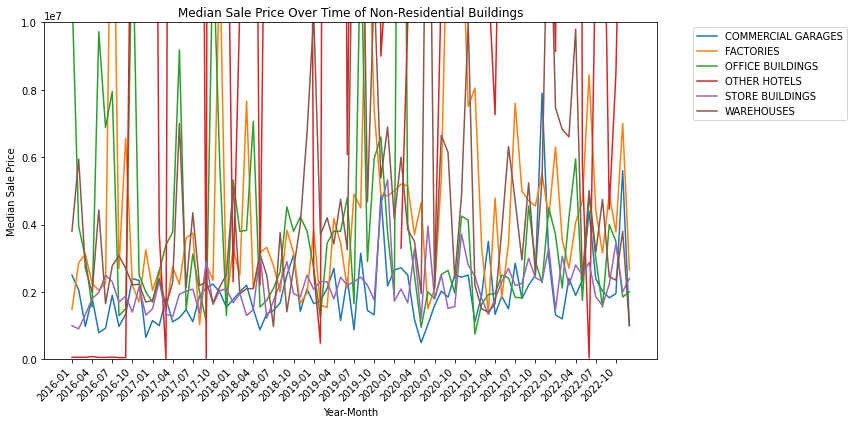

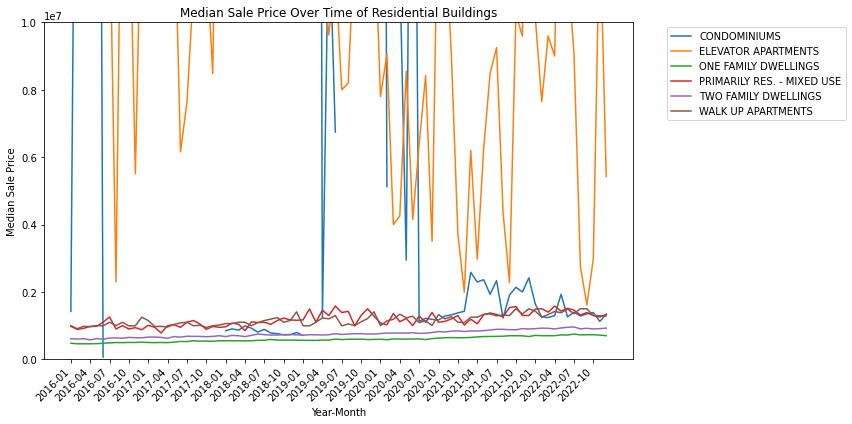

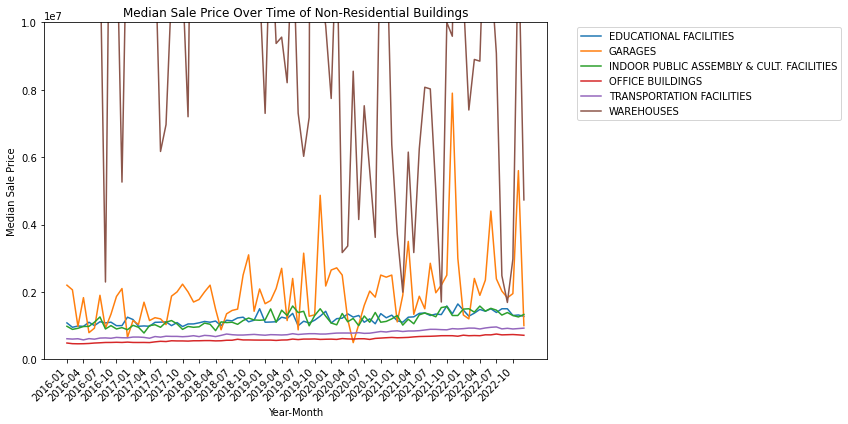

In [41]:
df_1 = pd.read_csv("filtered_data_197971.csv", index_col=0)
df_1 = df_1[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]

plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS CATEGORY","residential",1e7)
plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS CATEGORY","non-residential",1e7)
plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS AT TIME OF SALE","residential",1e7)
plot_x_by_y(df_1,"SALE PRICE","BUILDING CLASS AT TIME OF SALE","non-residential",1e7)

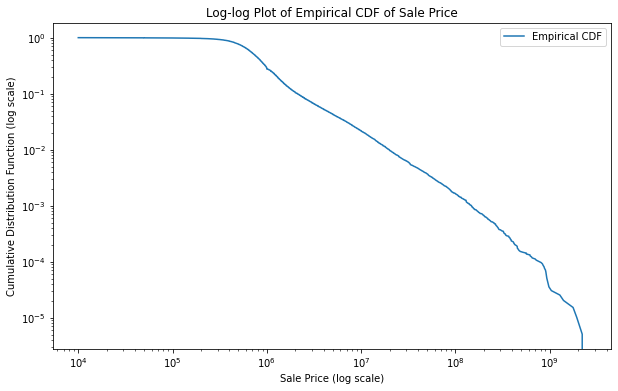

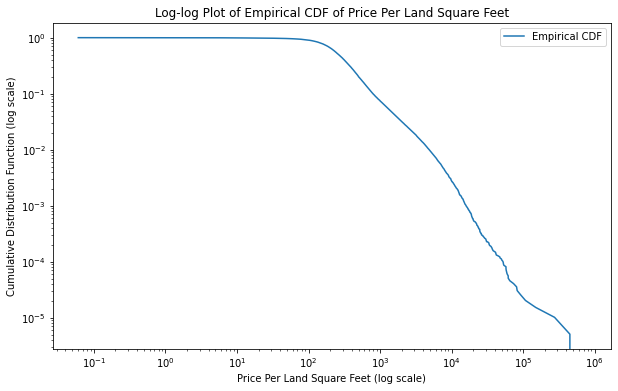

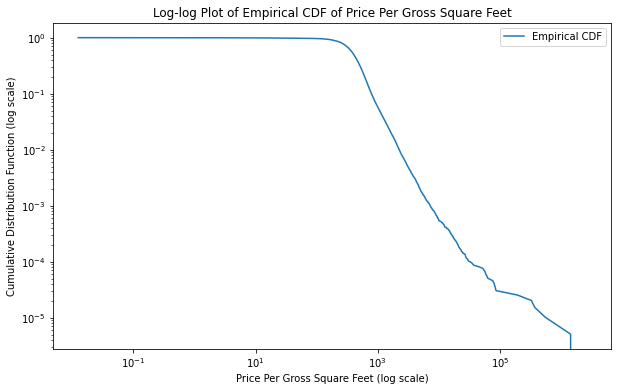

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

def loglog_plot(df,column):
    sorted_prices = df[column].sort_values()
    cumulative_distribution = 1-sorted_prices.rank() / len(sorted_prices)

    # Plot the CDF
    plt.figure(figsize=(10, 6))
    plt.plot(sorted_prices, cumulative_distribution, label='Empirical CDF')
    plt.xscale('log')
    plt.yscale('log')
    plt.title(title:=f'Log-log Plot of Empirical CDF of {column.title()}')
    plt.xlabel(f'{column.title()} (log scale)')
    plt.ylabel('Cumulative Distribution Function (log scale)')
    plt.legend()
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)
    plt.show()

loglog_plot(df_1,"SALE PRICE")
loglog_plot(df_1,"PRICE PER LAND SQUARE FEET")
loglog_plot(df_1,"PRICE PER GROSS SQUARE FEET")

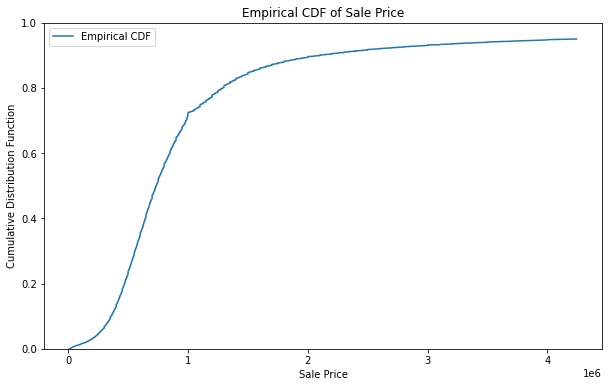

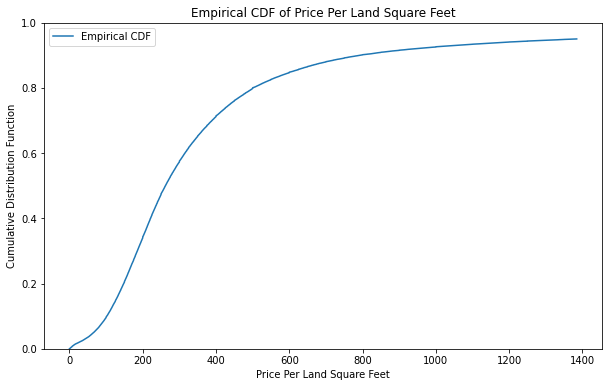

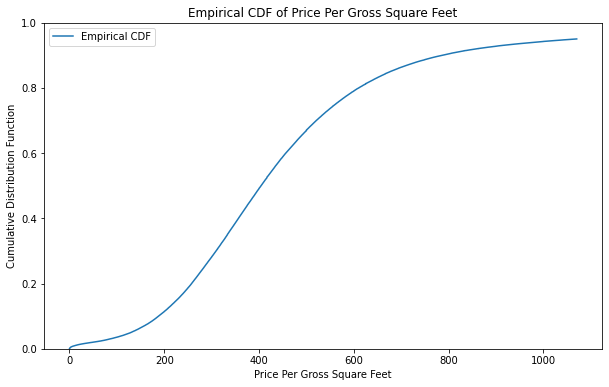

In [43]:
def CDF(df,column):
    sorted_prices = df[column].sort_values()
    cumulative_distribution = sorted_prices.rank() / len(sorted_prices)
    closest_element = min(cumulative_distribution, key=lambda x: abs(x - 0.95))
    idx = list(cumulative_distribution).index(closest_element)
    plt.figure(figsize=(10, 6))
    plt.plot(sorted_prices[:idx], cumulative_distribution[:idx], label='Empirical CDF')
    plt.title(title:=f'Empirical CDF of {column.title()}')
    plt.xlabel(f'{column.title()}')
    plt.ylabel('Cumulative Distribution Function')
    plt.ylim([0,1])
    plt.legend()
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)
    plt.show()

CDF(df_1,"SALE PRICE")
CDF(df_1,"PRICE PER LAND SQUARE FEET")
CDF(df_1,"PRICE PER GROSS SQUARE FEET")

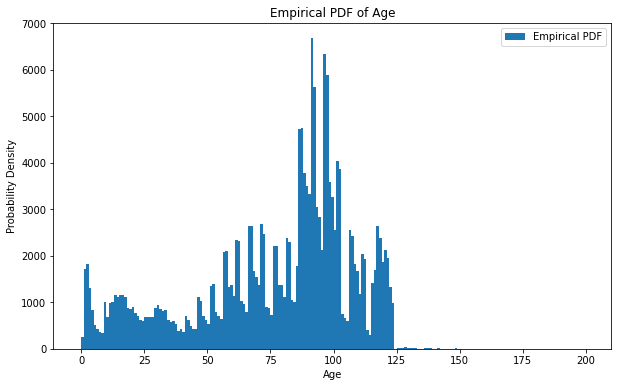

In [44]:

plt.figure(figsize=(10, 6))
# sns.kdeplot(sorted_values[:idx], label='KDE', fill=True)
plt.hist(df_1["AGE"],bins=201, label='Empirical PDF')
plt.title(title:=f'Empirical PDF of {"AGE".title()}')
plt.xlabel(f'{"AGE".title()}')
plt.ylabel('Probability Density')
plt.legend()
file_path = os.path.join("../plots/", title)
plt.savefig(file_path)
plt.show()

In [139]:
max(df_1["AGE"]) - min(df_1["AGE"])

201.0

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1242: RuntimeWarning: divide by zero encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1242: RuntimeWarning: invalid value encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1243: RuntimeWarning: divide by zero encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1243: RuntimeWarning: invalid value encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1244: RuntimeWarning: divide by zero encountered in divide
  c = dx1 / (dx2 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python

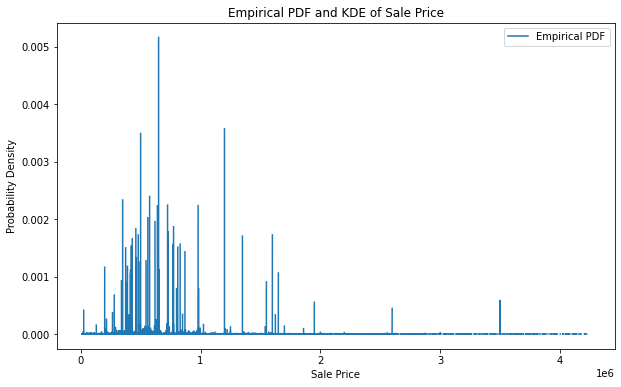

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1242: RuntimeWarning: divide by zero encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1242: RuntimeWarning: invalid value encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1243: RuntimeWarning: divide by zero encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1243: RuntimeWarning: invalid value encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1244: RuntimeWarning: divide by zero encountered in divide
  c = dx1 / (dx2 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python

<Figure size 432x288 with 0 Axes>

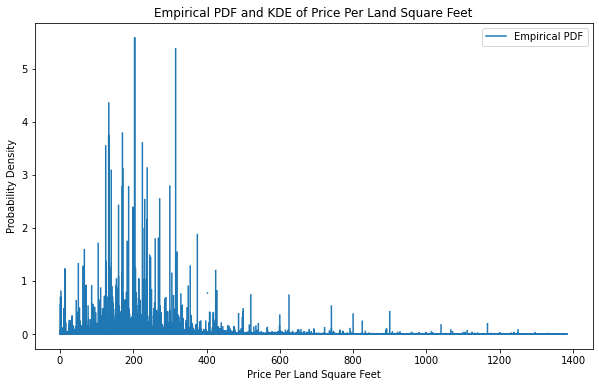

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1242: RuntimeWarning: divide by zero encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1242: RuntimeWarning: invalid value encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1243: RuntimeWarning: divide by zero encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1243: RuntimeWarning: invalid value encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:1244: RuntimeWarning: divide by zero encountered in divide
  c = dx1 / (dx2 * (dx1 + dx2))
c:\Users\DELL\AppData\Local\Programs\Python\Python

<Figure size 432x288 with 0 Axes>

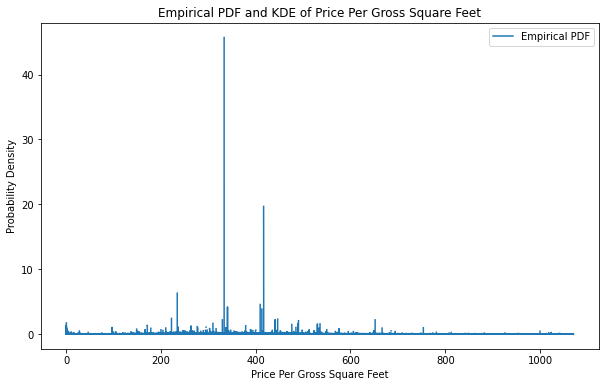

<Figure size 432x288 with 0 Axes>

In [45]:
import numpy as np
import seaborn as sns

def PDF_with_KDE(df, column):
    if column != "AGE":
        sorted_values = df[column].sort_values()
        cumulative_distribution = sorted_values.rank() / len(sorted_values)
        closest_element = min(cumulative_distribution, key=lambda x: abs(x - 0.95))
        idx = list(cumulative_distribution).index(closest_element)
        pdf_values = np.gradient(cumulative_distribution, sorted_values)
        plt.figure(figsize=(10, 6))
        # sns.kdeplot(sorted_values[:idx], label='KDE', fill=True)
        plt.plot(sorted_values[:idx], pdf_values[:idx], label='Empirical PDF')
        plt.title(title:=f'Empirical PDF and KDE of {column.title()}')
        plt.xlabel(f'{column.title()}')
        plt.ylabel('Probability Density')
        plt.legend()
        plt.show()
    else:
        sorted_values = df[column].sort_values()
        cumulative_distribution = sorted_values.rank() / len(sorted_values)
        pdf_values = np.gradient(cumulative_distribution, sorted_values)
        plt.figure(figsize=(10, 6))
        # sns.kdeplot(sorted_values[:idx], label='KDE', fill=True)
        plt.plot(sorted_values, pdf_values, label='Empirical PDF')
        plt.title(title:=f'Empirical PDF and KDE of {column.title()}')
        plt.xlabel(f'{column.title()}')
        plt.ylabel('Probability Density')
        plt.legend()
        plt.show()
    file_path = os.path.join("../plots/", title)
    plt.savefig(file_path)

PDF_with_KDE(df_1,"SALE PRICE")
PDF_with_KDE(df_1,"PRICE PER LAND SQUARE FEET")
PDF_with_KDE(df_1,"PRICE PER GROSS SQUARE FEET")

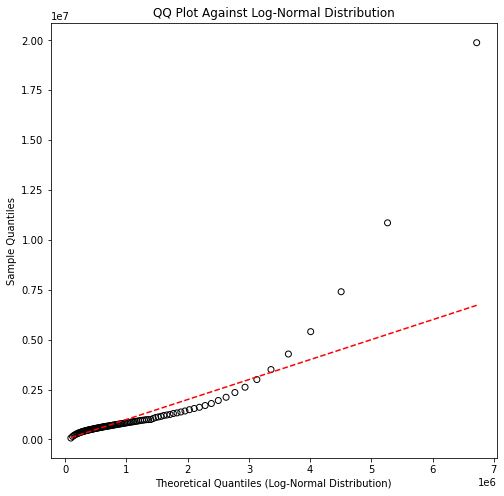

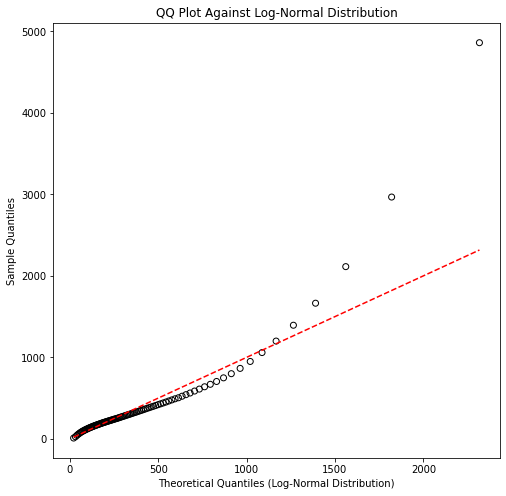

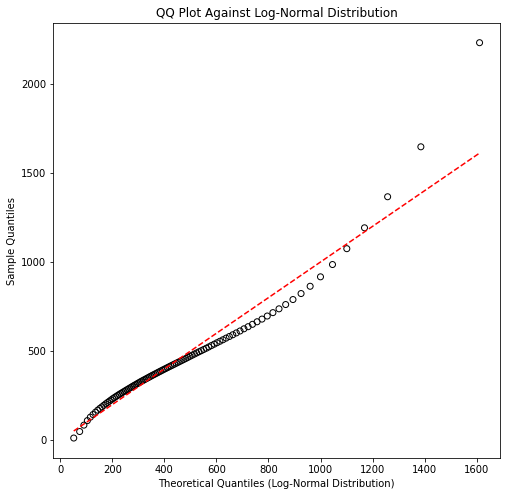

In [142]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

def QQ_plot_against_lognormal(data, plot_title='QQ Plot Against Log-Normal Distribution'):
    # Fit the data to a log-normal distribution
    shape, loc, scale = stats.lognorm.fit(data)
    # Generate theoretical quantiles from the log-normal distribution
    theoretical_quantiles = stats.lognorm.ppf(np.linspace(0.01, 0.99, 100), shape, loc=loc, scale=scale)
    # Generate sample quantiles from the data
    sample_quantiles = np.percentile(data, np.linspace(1, 99, 100))
    # Create a QQ plot
    plt.figure(figsize=(8, 8))
    plt.scatter(theoretical_quantiles, sample_quantiles, edgecolors='k', facecolors='none')
    plt.title(plot_title)
    plt.xlabel('Theoretical Quantiles (Log-Normal Distribution)')
    plt.ylabel('Sample Quantiles')
    plt.plot([np.min(theoretical_quantiles), np.max(theoretical_quantiles)], [np.min(theoretical_quantiles), np.max(theoretical_quantiles)], color='r', linestyle='--')
    plt.show()
    file_path = os.path.join("../plots/", plot_title)
    plt.savefig(file_path)

# Example usage:
# Replace 'your_data' with your actual dataset
QQ_plot_against_lognormal(df_1["SALE PRICE"])
QQ_plot_against_lognormal(df_1["PRICE PER LAND SQUARE FEET"])
QQ_plot_against_lognormal(df_1["PRICE PER GROSS SQUARE FEET"])

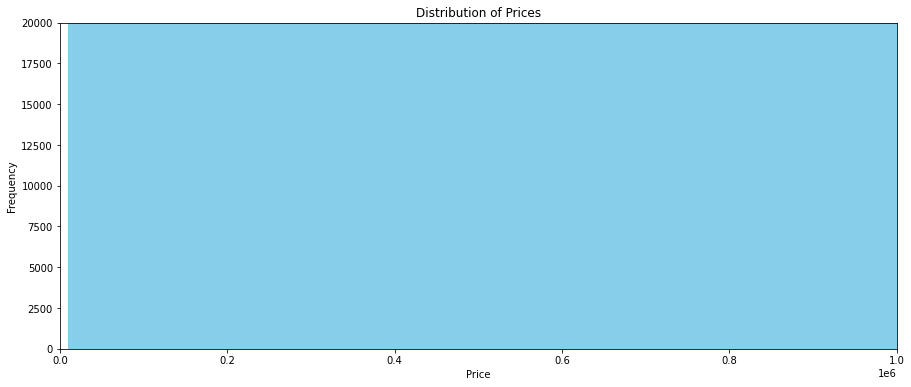

In [88]:
import pandas as pd
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))
plt.hist(df_1["SALE PRICE"], bins=500, color='skyblue', edgecolor='skyblue')
plt.title('Distribution of Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.xlim([0,1000000])
plt.ylim([0,2e4])
plt.show()

In [ ]:
df = pd.read_csv("filtered_data_197971.csv", index_col=0)
df = df[['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
       'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
       'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
       'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE DATE', 'Latitude',
       'Longitude', 'Community Board', 'Council District']]

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv3D, MaxPooling3D, Flatten, Dense, BatchNormalization

# Load your dataset
# Assuming df is your pandas DataFrame containing the provided data
# Make sure to preprocess the data, handle missing values, encode categorical variables, etc.

# Example preprocessing
df['SALE DATE'] = pd.to_datetime(df['SALE DATE'])
df['MONTH'] = df['SALE DATE'].dt.month
df['YEAR'] = df['SALE DATE'].dt.year
df["SALE TIMES"] = df["ADDRESS"].map(df["ADDRESS"].value_counts().to_dict())

# Select relevant features and target variable
features = ['MONTH', 'YEAR',
            'NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'ADDRESS',
            'ZIP CODE', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'LAND SQUARE FEET',
            'GROSS SQUARE FEET', 'PRICE PER LAND SQUARE FEET',
            'PRICE PER GROSS SQUARE FEET', 'AGE', 'TAX CLASS AT TIME OF SALE',
            'BUILDING CLASS AT TIME OF SALE', 'SALE DATE', 'Latitude',
            'Longitude', 'Community Board', 'Council District']
target = 'SALE PRICE'

X = df[features].values
y = df[target].values

CATEGORICAL_FEATURES = ["NEIGHBORHOOD", "BUILDING CLASS CATEGORY", "BLOCK"]

# Encode categorical variables
# Example: Encoding 'NEIGHBORHOOD'
label_encoder = LabelEncoder()
X[:, CATEGORICAL_FEATURES] = label_encoder.fit_transform(X[:, CATEGORICAL_FEATURES])

# Standardize numeric features
scaler = StandardScaler()
X[:, NUMERICAL_FEATURES] = scaler.fit_transform(X[:, NUMERICAL_FEATURES])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=False)

# Reshape input for 3D CNN (assuming you have sequential data)
X_train_reshaped = X_train.reshape((1, X_train.shape[0], X_train.shape[1], 1, len(features)))
X_test_reshaped = X_test.reshape((1, X_test.shape[0], X_test.shape[1], 1, len(features)))

# Build 3D CNN model
model = Sequential()
model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', input_shape=(None, X_train.shape[1], 1, len(features))))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))
model.add(Conv3D(128, kernel_size=(3, 3, 3), activation='relu'))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1))  # Output layer for regression task

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32, validation_split=0.1)

# Make predictions
y_pred = model.predict(X_test_reshaped)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error on Test Set: {mse}')